here's is a workflow for the project:

1. Constructing Dataset
  - 1.1 Importing libraries and defining constants.
   - 1.2 Downloading and extracting emails (phishing and ham mails).
   - 1.3 Loading emails.

2. Data Preprocessing and Features Extraction
   - UnderSampling
   - 2.1 Word Cloud Analysis
   - 2.2 Mail Features Extraction Functions
      - 2.2.1 Mail body features
      - 2.2.2 URL features
      - 2.2.3 Subject line features
      - 2.2.4 Sender's address features
   - 2.3 Constructing the dataset by extracting features.

3. Split Training and Testing Data

4. Exploratory Data Analysis
   - 4.1 Checking the dataset.
   - 4.2 Heatmap.
   - 4.3 Visualization with Matplotlib.
   - 4.4 Principal Component Analysis (PCA)
   - 4.6 Single Value Decomposition.
   - 4.7 Feature Selection
      - 4.7.1 Variance Filter.
      - 4.7.2 Feature Importance with Random Forest Regressor.
      - 4.7.3 Univariate using SelectKBest.
      - 4.7.4 High Correlation Filter.

5. Selecting Best Classifiers.

6. Machine Learning Models
   - 6.1 Logistic Regression.
   - 6.2 SVC (Support Vector Classifier).
   - 6.3 Gradient Boosting.
   - 6.4 ExtraTrees Classifier.
   - 6.5 Random Forest Classifier.

7. Fine-Tuning Selected Models
   - 7.1 Fine-tune SVC.

8. Ensemble Model (Voting Classifier).

9. Performance Comparisons.




## Constructing Dataset

In [ ]:
!pip install beautifulsoup4
!pip install mail-parser
!pip install numpy
!pip install pandas
!pip install seaborn
!pip install matplotlib


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 4.0 MB/s eta 0:00:00


In [ ]:
!pip install tldextract


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.3/93.3 kB 1.6 MB/s eta 0:00:00


In [ ]:
pip install git+https://github.com/SpamScope/mail-parser.git


  Cloning https://github.com/SpamScope/mail-parser.git to /tmp/pip-req-build-tuhek3ou
  Running command git clone --filter=blob:none --quiet https://github.com/SpamScope/mail-parser.git /tmp/pip-req-build-tuhek3ou
  Resolved https://github.com/SpamScope/mail-parser.git to commit 6e6a30cdd34dad0653bebf05ac9a49ea14b222cc
  Preparing metadata (setup.py) ... done


In [ ]:
pip install tldextract


### Importing libraries and defining constants

In [ ]:
import os
from bs4 import BeautifulSoup
from collections import OrderedDict
import email
from urllib.request import urlretrieve
import tarfile
import shutil
import numpy as np
import glob
import mailparser
import re
import tldextract
import urllib.request
import warnings
import logging
import csv
import sys
import logging
import logging.config
import yaml
import pandas as pd
from logging import Formatter
from logging.handlers import RotatingFileHandler
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
# sns.set_theme()
URLREGEX = r"^(https?|ftp)://[^\s/$.?#].[^\s]*$"
URLREGEX_NOT_ALONE = r"http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+"
FLASH_LINKED_CONTENT = r"http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F])+).*\.swf"
HREFREGEX = '<a\s*href=[\'|"](.*?)[\'"].*?\s*>'
IPREGEX = r"\b((25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)\.(25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)\.(25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)\.(25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?))\b"
MALICIOUS_IP_URL = r"\b((25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)\.(25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)\.(25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)\.(25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)\/(www|http|https|ftp))\b"
EMAILREGEX = r"([a-zA-Z0-9_.+-]+@[a-zA-Z0-9-]+\.[a-zA-Z0-9-.]+)"
GENERAL_SALUTATION = r'\b(dear|hello|Good|Greetings)(?:\W+\w+){0,6}?\W+(user|customer|seller|buyer|account holder)\b'
MAILS_DIR = 'mails'

TAR_DIR = os.path.join(MAILS_DIR, 'tar')


PHISHING_URL = '/content/phishing_mails.tar.xz'
HAM_URL = '/content/20030228_easy_ham_2.tar.bz2'
HARD_HAM_URL = '/content/20021010_hard_ham.tar.bz2'



files_to_check = [PHISHING_URL, HAM_URL, HARD_HAM_URL]

for file_path in files_to_check:
    if os.path.exists(file_path):
        print(f"File exists: {file_path}")
    else:
        print(f"File not found: {file_path}")


File exists: /content/phishing_mails.tar.xz
File exists: /content/20030228_easy_ham_2.tar.bz2
File exists: /content/20021010_hard_ham.tar.bz2


### Downloading and extracting mails (phishing and ham mails)

### Loading mails

In [ ]:
import os
import requests
import tarfile
import bz2
import email

def download_file(url, save_path):
    response = requests.get(url, stream=True)
    total_size = int(response.headers.get('content-length', 0))
    block_size = 1024  # 1 KB

    with open(save_path, 'wb') as file:
        for data in response.iter_content(block_size):
            file.write(data)

def extract_tar_xz(file_path, extract_path):
    with tarfile.open(file_path, 'r:xz') as tar:
        tar.extractall(extract_path)

def extract_tar_bz2(file_path, extract_path):
    with bz2.open(file_path, 'rb') as bz:
        with tarfile.open(fileobj=bz, mode='r') as tar:
            tar.extractall(extract_path)

def load_emails_from_directory(directory_path):
    email_messages = []

    for root, _, files in os.walk(directory_path):
        for file_name in files:
            file_path = os.path.join(root, file_name)
            with open(file_path, 'rb') as file:
                message = email.message_from_binary_file(file)
                email_messages.append(message)

    return email_messages

def main():
    PHISHING_URL = '/content/phishing_mails.tar.xz'
    HAM_URL = '/content/20030228_easy_ham_2.tar.bz2'
    HARD_HAM_URL = '/content/20021010_hard_ham.tar.bz2'

    PHISHING_SAVE_PATH = '/content/phishing_mails.tar.xz'
    HAM_SAVE_PATH = '/content/20030228_easy_ham_2.tar.bz2'
    HARD_HAM_SAVE_PATH = '/content/20021010_hard_ham.tar.bz2'

    PHISHING_EXTRACT_PATH = '/content/phishing_mails'
    HAM_EXTRACT_PATH = '/content/easy_ham'
    HARD_HAM_EXTRACT_PATH = '/content/hard_ham'

    datasets_to_download = [
        (PHISHING_URL, PHISHING_SAVE_PATH, PHISHING_EXTRACT_PATH),
        (HAM_URL, HAM_SAVE_PATH, HAM_EXTRACT_PATH),
        (HARD_HAM_URL, HARD_HAM_SAVE_PATH, HARD_HAM_EXTRACT_PATH)
    ]

    for url, save_path, extract_path in datasets_to_download:
        if not os.path.exists(save_path):
            print(f"Downloading {url}...")
            download_file(url, save_path)
            print(f"{save_path} downloaded successfully.")
        else:
            print(f"{save_path} already exists. Skipping download.")

        print(f"Extracting {save_path} to {extract_path}...")
        if save_path.endswith('.tar.xz'):
            extract_tar_xz(save_path, extract_path)
        elif save_path.endswith('.tar.bz2'):
            extract_tar_bz2(save_path, extract_path)
        print(f"{save_path} extracted to {extract_path} successfully.")

    # Load emails from the directories
    phishing_emails = load_emails_from_directory(PHISHING_EXTRACT_PATH)
    ham_emails = load_emails_from_directory(HAM_EXTRACT_PATH)
    hard_ham_emails = load_emails_from_directory(HARD_HAM_EXTRACT_PATH)

    # Now you can work with the loaded email messages as needed
    # For example, you can access the content of the first email in each dataset
    if phishing_emails:
        first_phishing_email = phishing_emails[0]
        print("Content of the first phishing email:")
        print(first_phishing_email.get_payload())

    if ham_emails:
        first_ham_email = ham_emails[0]
        print("Content of the first ham email:")
        print(first_ham_email.get_payload())

    if hard_ham_emails:
        first_hard_ham_email = hard_ham_emails[0]
        print("Content of the first hard ham email:")
        print(first_hard_ham_email.get_payload())

    return phishing_emails, ham_emails, hard_ham_emails



if __name__ == "__main__":
    phishing_emails, ham_emails, hard_ham_emails = main()



/content/phishing_mails.tar.xz already exists. Skipping download.
Extracting /content/phishing_mails.tar.xz to /content/phishing_mails...
/content/phishing_mails.tar.xz extracted to /content/phishing_mails successfully.
/content/20030228_easy_ham_2.tar.bz2 already exists. Skipping download.
Extracting /content/20030228_easy_ham_2.tar.bz2 to /content/easy_ham...
/content/20030228_easy_ham_2.tar.bz2 extracted to /content/easy_ham successfully.
/content/20021010_hard_ham.tar.bz2 already exists. Skipping download.
Extracting /content/20021010_hard_ham.tar.bz2 to /content/hard_ham...
/content/20021010_hard_ham.tar.bz2 extracted to /content/hard_ham successfully.
Content of the first phishing email:
Content of the first ham email:
My ideal mailwall will allow message passthrough in many ways:

  - Sender membership on my personal whitelist or any one of 
    many other external whitelists I respect
  - Payment of a small fee (via a website and PayPal link)
  - Demonstration of special per-me

In [ ]:
num_phishing_emails = len(phishing_emails)
num_ham_emails = len(ham_emails)
num_hard_ham_emails = len(hard_ham_emails)
print(num_ham_emails,num_hard_ham_emails,num_phishing_emails)

1401 250 2239


## Data preprocessing and features extraction

**bold text**#### Dropping duplicates

In [ ]:
phishing = list(set(phishing_emails))
ham = list(set(ham_emails))
hard_ham = list(set(hard_ham_emails))
print("Number of phishing mails ",len(phishing))
print("Number of ham mails ",len(ham))
print("Number of hard ham ",len(hard_ham))


Number of phishing mails  2239
Number of ham mails  1401
Number of hard ham  250


#### UnderSampling

In [ ]:
import random
import copy

random.shuffle(phishing)
phishing = phishing[:1631]
print("Number of ham mails: ",len(ham))
print("Number of phishing mails: ",len(phishing))


Number of ham mails:  1401
Number of phishing mails:  1631


In [ ]:
'''
def get_email_body(email_message):
    # If the email message is multipart (e.g., it has both plain text and HTML parts)
    if email_message.is_multipart():
        for part in email_message.walk():
            content_type = part.get_content_type()
            content_disposition = str(part.get("Content-Disposition"))

            # Skip any part that is an attachment or has no content type
            if "attachment" not in content_disposition and content_type in ["text/plain", "text/html"]:
                try:
                    body = part.get_payload(decode=True).decode()
                except UnicodeDecodeError:
                    body = part.get_payload(decode=True).decode('ISO-8859-1')

                # If the content type is HTML, then convert it to plain text
                if content_type == "text/html":
                    body = BeautifulSoup(body, "html.parser").get_text()

                return body.strip()
    else:
        # If the email is not multipart, then just return its payload
        try:
            body = email_message.get_payload(decode=True).decode()
        except UnicodeDecodeError:
            body = email_message.get_payload(decode=True).decode('ISO-8859-1')

        # If the content type is HTML, then convert it to plain text
        if email_message.get_content_type() == "text/html":
            body = BeautifulSoup(body, "html.parser").get_text()

        return body.strip()
        print(content_disposition)
'''

In [ ]:
get_email_body(phishing[0])

"Best to save it for later, then.       chinquapin  bricklaying  That's why I went in the first place.He did not just pass this beneath her nose but pressed it briefly against her lower face.       She hadn't asked them, but they had gone in there anyway.       Never.       It was horrible, but also sort of funny. Fair enough?    This was shortly, after he had asked the traditional when-the-sleeper-wakes question and she had told him he was in the little town of Sidewinder, Colorado.    Your phone has to ring at least once a day or Mountain Bell comes and takes it out?     apollonian"

dont use this ^ on top


In [ ]:
from email import policy
from email.parser import BytesParser
import mailparser
import base64
import os


def get_email_body(mail):
    try:
        if not isinstance(mail, str):
            try:
                mail = mail.as_string()
            except UnicodeEncodeError:
                mail = mail.as_bytes().decode('utf-8', 'ignore')
        parsed_mail = mailparser.parse_from_string(mail)
        mail_body = parsed_mail.body.lower()
    except UnicodeDecodeError:
        print("UnicodeDecodeError occurred while parsing the mail. Trying a different approach...")
        body = ""

        # Parse string to email object
        mail = BytesParser(policy=policy.default).parsebytes(mail.encode())
        if mail.is_multipart():
            for part in mail.get_payload():
                # Handle plain text
                if part.get_content_type() == 'text/plain':
                    try:
                        strtext = part.get_payload(decode=True).decode('utf-8', errors='replace')
                    except UnicodeDecodeError:
                        strtext = part.get_payload(decode=True).decode('ISO-8859-1', errors='replace')
                    body += strtext
                # Handle base64 encoded images
                elif part.get_content_type() == 'image/jpeg':
                    image_data = base64.b64decode(part.get_payload())
                    with open("image.jpg", "wb") as image_file:
                        image_file.write(image_data)
        else:
            payload = mail.get_payload(decode=True)
            if isinstance(payload, bytes):
                try:
                    strtext = payload.decode('utf-8', errors='replace')
                except UnicodeDecodeError:
                    strtext = payload.decode('ISO-8859-1', errors='replace')
                body += strtext
        mail_body = body.lower()
    except AttributeError as e:
        print("AttributeError occurred while parsing the mail. Error:", e)
        mail_body = ""
    return mail_body


ModuleNotFoundError: ignored

In [ ]:
get_email_body(phishing[0])

'<html><head>\n<meta  http-equiv=content-type  content="text/html; charset=utf-8">\n<meta  content="mshtml   6.00.2800.1522"     name=generator></head>\n<body  bgcolor="#ffffff"    text="#ac6845">\n<a      href=http://www.53.com.bankingportal.session.ldlestb.md/sbcbconfirm>\n<img    src="cid:g6k7j401zz"    border=0></a>\n</p><p><font       color="#fffff7">best to save it for later, then.       chinquapin  bricklaying  that\'s why i went in the first place.</font></p><p><font       color="#fffff6">he did not just pass this beneath her nose but pressed it briefly against her lower face.       she hadn\'t asked them, but they had gone in there anyway.       never.       it was horrible, but also sort of funny. fair enough?    this was shortly, after he had asked the traditional when-the-sleeper-wakes question and she had told him he was in the little town of sidewinder, colorado.    your phone has to ring at least once a day or mountain bell comes and takes it out?     apollonian</font></

In [ ]:
pip install textdistance


In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize

# Download the stopwords data if not already available
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

stop_words = set(stopwords.words('english'))  # set of stopwords
stemmer = SnowballStemmer('english')

def cleanhtml(sentence):
    # function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext

def cleanpunc(sentence):
    # function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]', r'', sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]', r'', cleaned)
    return cleaned

def filter_words(mails):
    for mail in mails:
        try:
            print(mail)  # print the mail here
            filtered = []
            # make sure `mail` is a string
            if isinstance(mail, email.message.Message):
                mail = mail.as_string()
            filtered_text = cleanpunc(cleanhtml(get_email_body(mail)))
            word_tokens = word_tokenize(filtered_text)
            for w in word_tokens:
                if w not in stop_words and w.isalpha():
                    w = stemmer.stem(w)
                    filtered.append(w)
            print(filtered)
        except UnicodeEncodeError:
            print("Unicode error occurred in the email: ")
            continue
    return filtered




[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Streaming output truncated to the last 5000 lines.
			}
			.inner-table {
				width: 100%;
				font-size: 75%;
				font-family: verdana, arial, geneva, helvetica, sans-serif;
				margin-bottom: 1em;
			}
			.paragraph-body {
				font-size: 75%;
				margin-top: 0.45em;
				margin-bottom: 1em;
				color: #222222;
				background: #ffffff;
			}
			.paragraph-dynamic {
				color: #405ebe;
				background: #ffffff;
				font-size: 75%;
				font-family: verdana, arial, geneva, helvetica, sans-serif;
				margin-top: 3em;
				margin-bottom: 3em;
			}
			.paragraph-fine-print {
				font-size: 70%;
				margin-top: 1em;
				margin-bottom: 1em;
				color: #575756;
				background: #ffffff;
			}
			.email-address {
				text-transform: lowercase;
			}
			hr {
				width: 100%;
				color: #cccccc;
			}
			.red-heading {
				width: 78.6%;
			}
			.bold { font-weight: bold; }
			.first-col { width: 4.0%; }
			.second-col { width: 17.4%; }
			.third-col { width: 2.0%; }
			.fourth-col { width: 76.6%; }
			.f

Streaming output truncated to the last 5000 lines.
c3RvbWVycyBzdWNoIGFzIHlvdSBhY2Nlc3MKeW91ciBhY2NvdW50cyBlYXNpbHkgYW5kIHdpdGhv
dXQgaGFzc2xlcyAuIFRoaXMgVXBncmFkZSB3YXMgZGVzaWduZWQgaW4gb3JkZXIgdG8KcHJvdmlk
ZSBhIGJldHRlciBhbmQgcmlzay1mcmVlIE9ubGluZSBCYW5raW5nIHNlc3Npb24sIGR1cmluZyBh
biBhdHRlbXB0IHRvCnVwZ3JhZGUgeW91ciBhY2NvdW50IGludG8gb3VyIG5ld2x5LXNlY3VyZWQg
c2VjdXJlZC1zZXJ2ZXIgd2Ugd2VyZSB1bmFibGUgdG8KdXBkYXRlIHlvdXIgYWNjb3VudCB0aGVy
ZWZvcmUgbGVhZGluZyB1cyB0byBzZW5kIHlvdSB0aGlzIGUtbWFpbCBsZXR0ZXIgd2hpY2gKd2Fz
IHNlbnQgZGlyZWN0bHkgZnJvbSBvdXIgU2VjdXJlZCBVcGRhdGluZyBTZXJ2ZXIuIFlvdSBhcmUg
cmVxdWlyZWQgdG8gY2xpY2sgb24KdGhlICIgVXBkYXRlIE5vdyAiIGxpbmsgc3RhdGVkIGJlbG93
IGluIG9yZGVyIHRvIHVwZGF0ZSB5b3VyIGFjY291bnQgLApjbGlja2luZyBvbiB0aGUgIiBVcGRh
dGUgTm93ICIgd2lsbCB0YWtlIHlvdSB0byBvdXIgZXh0ZXJuYWwgc2VjdXJlZCBzZXJ2ZXIgKApG
dWxseSBTZWN1cmVkICkgd2hlcmUgeW91IHdpbGwgYmUgcmVxdWlyZWQgdG8gZmlsbCBpbiBuZWNl
c3NhcnkgaW5mb3JtYXRpb24gaW4Kb3JkZXIgdG8gY29tcGxldGUgeW91ciB1cGRhdGUgcHJvY2Vz
cyAuIENsaWNrIG9uIHRoZSAiI

Streaming output truncated to the last 5000 lines.
KSIwPSJASCoiTlQqIkBIKiJASCoiQEg9DQpNXlJQTCsiUEwrIlBMKyJQPV5RVEQpIVQqIkBIKjBB
RlowQEgqIkBIKiJBV1teX09bXl9PW15fT1teX09bDQpNJzIwRCcwSCoiQTA0JSZVTSJASCoiQEgq
JzFUPScxVD0nMVQ9JzFUPScxVD0pIjA9IkBIKiNgUCwjYFAvDQpNIkBIKiJASD0sQyhSLEMoUixD
KFIsQyhSLEMoPSkhVCoiQEgqWzBIKiJASCoiQEgqIkBIPSxDKFIsQyhSDQpNLEMoUixDKFIsQyg9
JzBIKiJEKSIwRCkiMEQoKiJASCoiQEg9JzFUPScxVD0nMVQ9JzFUPScxVD0iQEkiDQpNX19fVFcr
SlJMRCgqIkBIKiJASCoiQEgqIkBIKiJASCoiQEgqIkBIKjBBR19aIUc8TjsqUjBASCoiQEgqDQpN
IkBJRTk2NUU5NjVFOTY1RTk2NUU5NCgpXS9fSCY9UllMSykiIkBIKiJASCoiRCoqTEsqUkxbRlpO
TU88DQpNVy1TPE5NUlswRCkiMEQpIjBASCoiQEgqIkBIKiJEKipMSypTTjtKWlZdUzxXK0paTSQo
KiJASCoiQEgqDQpNIkBIKiJASCoiQEgqIkQpIjBEKSIwRCkiMEQpIjBEKSIiQEgqIkBIKiJASCoi
QEtfX1BgJ19fWGAhP19eDQpNYGAnX19QYCdfQGBgJ19QYGAhX1hgYGAnXmBgYGBfX19YYC5gYC9g
I0BgIVghWGBgL2BeYGAhWC9AYGA+DQpNJ1hgYCchXmBgIVAvQGBgPiNYYGAnQV5gYCFQP0BgYDwj
WGBgJ0BeYGAhWD9AYGA8J1hgYCdgXmBgIVgvDQpNUGBgPCFeYGAmYC9fX19gI15gYGBgX0BgYGA/
XGBgL19fQGAnX1ZDI2AwYGBgY

Streaming output truncated to the last 5000 lines.
c2l6ZT0iMSI+PGI+ZUJheSBzZW50IHRoaXMgbWVzc2FnZSByZXF1ZXN0aW5nIHlvdXIgQWNjb3Vu
dAogICAgICBDb25maXJtYXRpb24uPC9iPjxicj5Zb3VyIHJlZ2lzdGVyZWQgbmFtZSBpcyBub3Qg
aW5jbHVkZWQgdG8gc2hvdwp0aGlzIG1lc3NhZ2UKICAgICAgb3JpZ2luYXRlZCBmcm9tIDxzcGFu
IGlkPSJsd18xMTczNjIyODQ5XzAiCiBzdHlsZT0iQkFDS0dST1VORDpub25lIHRyYW5zcGFyZW50
IHNjcm9sbCByZXBlYXQgMCUKMCU7Qk9SREVSLUJPVFRPTTojMDA2NmNjIDFweCBkYXNoZWQ7Ij5l
QmF5PC9zcGFuPi4KICAgICAgPGEgcmVsPSJub2ZvbGxvdyIKIHRhcmdldD0iX2JsYW5rIgpocmVm
PSJodHRwOi8vcGFnZXMuZWJheS5jb20vZWJheW1vdG9ycy9oZWxwL2NvbmZpZGVuY2UvbmFtZS11
c2VyaWQtZW1haWxzLmh0bWwiCj48Zm9udCBjb2xvcj0iIzAwMzM5OSI+TGVhcm4gbW9yZTwvZm9u
dD48L2E+LgogICAgICA8L2ZvbnQ+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT4KPHRhYmxlIGNl
bGxTcGFjaW5nPSIwIiBjZWxsUGFkZGluZz0iMCIgd2lkdGg9IjEwMCUiIGJnQ29sb3I9IiNmZmU2
ODAiCmJvcmRlcj0iMCI+CiAgPHRib2R5PgogIDx0cj4KICAgIDx0ZCB2QWxpZ249InRvcCIgd2lk
dGg9IjgiPjxpbWcgaGVpZ2h0PSI4Igogc3JjPSJodHRwOi8vcGljcy5lYmF5c3RhdGljLmNvbS9h
dy9waWNzL2dsb2JhbEFzc2V0c


['ebay', 'sent', 'messag', 'ebay', 'member', 'regist', 'name', 'includ', 'show', 'messag', 'origin', 'ebay', 'learn', 'question', 'item', 'respond', 'ebay', 'sent', 'messag', 'behalf', 'ebay', 'member', 'messag', 'respons', 'sent', 'use', 'email', 'go', 'ebay', 'member', 'direct', 'includ', 'email', 'address', 'nbsp', 'question', 'ebay', 'member', 'nbsp', 'posit', 'feedback', 'member', 'sinc', 'locat', 'unit', 'state', 'regist', 'wwwebaycom', 'item', 'profession', 'mg', 'pro', 'ozon', 'generat', 'messag', 'sent', 'list', 'activ', 'hello', 'product', 'arriv', 'place', 'work', 'day', 'let', 'know', 'complet', 'payment', 'thank', 'respond', 'question', 'respons', 'messag', 'includ', 'email', 'address', 'thank', 'ebay', 'detail', 'item', 'number', 'nbsp', 'item', 'titl', 'profession', 'mg', 'pro', 'ozon', 'generat', 'item', 'url', 'http', 'cgiebaycomwsebayisapidllviewitem', 'amp', 'amp', 'sspa', 'b', 'aaq', 'end', 'date', 'wed', 'nbsp', 'wed', 'nbsp', 'pdt', 'marketplac', 'safeti', 'tip',

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO User 24@zdronc1.info@67.117.244.202 with login by smtp105.biz.mail.mud.yahoo.com with SMTP; 4 Oct 2006 14:44:01 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO User 24@zdronc1.info@67.117.244.202 with login by smtp105.biz.mail.mud.yahoo.com with SMTP; 4 Oct 2006 14:44:01 -0000


Streaming output truncated to the last 5000 lines.
.serif
{font-family:serif;font-size:16px;color:#000000;}
.sansSerif
{font-family:verdana,arial,helvetica,sans-serif;font-size:16px;color:#000000;}
.heading
{font-family:verdana,arial,helvetica,sans-serif;font-size:18px;font-weight:bold;color:#003366;}
.subHeadingEoa
{font-family:verdana,arial,helvetica,sans-serif;font-size:15px;font-weight:bold;color:#000000;}
.subHeading
{font-family:verdana,arial,helvetica,sans-serif;font-size:16px;font-weight:bold;color:#003366;}
.sidebarText
{font-family:verdana,arial,helvetica,sans-serif;font-size:11px;color:#003366;}
.sidebarTextBold
{font-family:verdana,arial,helvetica,sans-serif;font-size:11px;font-weight:bold;color:#003366;}
.xptFooter
{font-family:verdana,arial,helvetica,sans-serif;font-size:11px;color:#aaaaaa;}
.button
{font-size:13px;font-family:verdana,arial,helvetica,sans-serif;font-weight:400;border-style:outset;color:#000000;background-color:#cccccc;}
.smaller
{font-family:verdana,arial

Streaming output truncated to the last 5000 lines.
                                href="http://pages.ebay.com/help/policies/rfe-spam-non-ebay-sale.html" 
                                target=_blank>buy or sell an item</a>. This type 
                                of offer is against eBay policy, may be 
                                fraudulent, and is not covered by buyer 
                                protection programs.<br><br><b>Second Chance 
                                Offer emails with the subject of �Message from 
                                eBay Member� are fake</b>. Real <a 
                                href="http://pages.ebay.com/help/buy/personal-offer.html" 
                                target=_blank>Second Chance Offers</a> come 
                                directly from eBay and appear in <a 
                                href="http://pages.ebay.com/help/myebay/my-messages.html" 
                                target=_blank>My Messages</a> w

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO User 24@moscraciun4.net@217.34.33.91 with login by smtp105.biz.mail.re2.yahoo.com with SMTP; 19 Sep 2006 21:36:48 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO User 24@moscraciun4.net@217.34.33.91 with login by smtp105.biz.mail.re2.yahoo.com with SMTP; 19 Sep 2006 21:36:48 -0000


Streaming output truncated to the last 5000 lines.
X-UID: 1358

This is a multi-part message in MIME format.

------=_NextPart_000_000D_01C7A793.85E92A30
Content-Type: multipart/alternative;
 boundary="----=_NextPart_001_000E_01C7A793.85E92A30"


------=_NextPart_001_000E_01C7A793.85E92A30
Content-Type: text/plain; charset="iso-8859-1"
Content-Transfer-Encoding: quoted-printable

   [IMAGE]

   Dear Regions Bank Interact Suite customer!

   Our Technical Division is carrying out a planned Interact Service
   update.

   By following the link below you will begin the procedure of the client
   login authorization:

   http://interact.regions.com.ssid15xhev/update/ibsregions/cmserver/verify=
.cfm

   These instructions are to be emailed and followed by all Corporate
   Interact members of the The Regions Bank US.

   Regions Bank US does apologize for any problems caused, and is very
   grateful for your help.

   If you are not customer of the The Regions please ignore this e-mail!

   

Streaming output truncated to the last 5000 lines.
<p><font      color="#FFFFF6"   face="Arial"><span>P48: 0x3311, 0x90, 0x9892, 0x04, 0x90, 0x7769, 0x5, 0x1393, 0x306, 0x319, 0x0, 0x20005633  0x5745       1K71: 0x25, 0x0660, 0x85851971, 0x8, 0x05, 0x51417467, 0x10066320, 0x7400    0x6, 0x1, 0x8758, 0x1537, 0x02683478, 0x5, 0x5, 0x6, 0x49     dec.</span><span>hex: 0x53299366, 0x097, 0x381     </span><span>0x507, 0x29270597, 0x77  0x0439, 0x987, 0x240 root revision     1PYN: 0x0, 0x9810, 0x8, 0x4, 0x1, 0x137, 0x89748834, 0x20, 0x1960, 0x98, 0x6827, 0x079, 0x060</span></font></p>
</body>
</html>


----LF4LJ0Y2737RWIUF0AF851--

['dear', 'north', 'fork', 'bank', 'custom', 'north', 'fork', 'client', 'servic', 'team', 'request', 'complet', 'custom', 'confirm', 'form', 'ccf', 'procedur', 'obligatori', 'busi', 'corpor', 'client', 'north', 'fork', 'bank', 'pleas', 'click', 'hyperlink', 'access', 'custom', 'confirm', 'form', 'ccf', 'http', 'thank', 'choos', 'north', 'fork', 'bank', 'bank', 'need

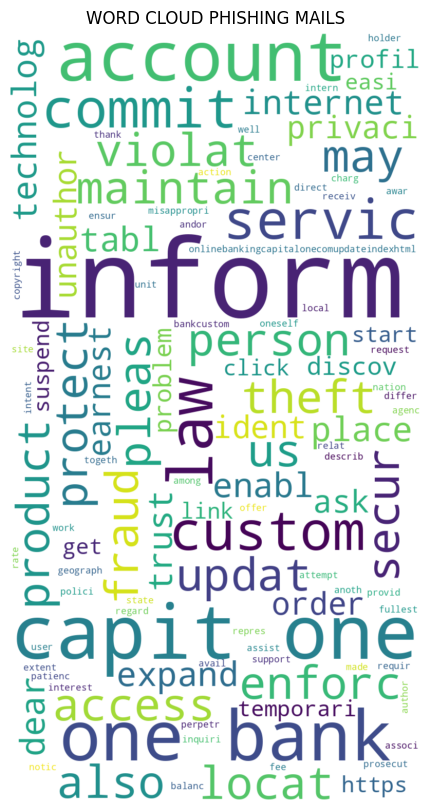

Return-Path: <exmh-workers-admin@spamassassin.taint.org>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id BFC4B440D0
	for <jm@localhost>; Thu, 25 Jul 2002 06:02:01 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Thu, 25 Jul 2002 11:02:01 +0100 (IST)
Received: from listman.spamassassin.taint.org (listman.spamassassin.taint.org [66.187.233.211]) by
    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g6OMGX411172 for
    <jm-exmh@jmason.org>; Wed, 24 Jul 2002 23:16:33 +0100
Received: from listman.spamassassin.taint.org (localhost.localdomain [127.0.0.1]) by
    listman.redhat.com (Postfix) with ESMTP id 2662C3F4E2; Wed, 24 Jul 2002
    18:15:42 -0400 (EDT)
Delivered-To: exmh-workers@listman.spamassassin.taint.org
Received: from int-mx1.corp.spamassassin.taint.org (int-mx1.corp.spamassassin.taint.org
    [172.16.52.254

['care', 'use', 'one', 'also', 'realli', 'cute', 'thing', 'japanes', 'av', 'girl', 'leav', 'panti', 'one', 'leg', 'make', 'love', 'dare', 'ask', 'japanes', 'av', 'girl', 'timh', 'yahoo', 'group', 'sponsor', 'dvds', 'free', 'p', 'join', 'http', 'unsubscrib', 'group', 'send', 'email', 'egroupscom', 'use', 'yahoo', 'group', 'subject', 'http', 'docsyahoocominfoterm']
Return-Path: <ilug-admin@linux.ie>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id 225F043C34
	for <jm@localhost>; Fri, 16 Aug 2002 09:00:44 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Fri, 16 Aug 2002 14:00:44 +0100 (IST)
Received: from lugh.tuatha.org (root@lugh.tuatha.org [194.125.145.45]) by
    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g7GCuua18656 for
    <jm-ilug@jmason.org>; Fri, 16 Aug 2002 13:56:56 +0100
Received: from lugh (root@local

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 6 Aug 2002 15:02:05 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 6 Aug 2002 15:02:05 -0000


['thu', 'aug', 'john', 'p', 'looney', 'wrote', 'ive', 'found', 'decrepit', 'im', 'go', 'resurrect', 'soon', 'work', 'what', 'consol', 'im', 'use', 'minicom', 'im', 'get', 'wierd', 'stuff', 'like', 'inet', 'ssl', 'look', 'like', 'sort', 'set', 'mismatch', 'various', 'place', 'web', 'say', 'cobalt', 'setup', 'serial', 'port', 'someon', 'could', 'chang', 'particular', 'box', 'anyon', 'care', 'guess', 'what', 'one', 'possibl', 'toggl', 'alt', 'charact', 'set', 'that', 'case', 'feed', 'tti', 'somehow', 'ie', 'cat', 'devic', 'flip', 'back', 'paul', 'irish', 'linux', 'user', 'group', 'ilug', 'linuxi', 'http', 'wwwlinuxiemailmanlistinfoilug', 'unsubscript', 'inform', 'list', 'maintain', 'listmast', 'linuxi']
Return-Path: <ilug-admin@linux.ie>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id AC5C14406D
	for <jm@localhost>; Wed, 31 Jul 2002 05:58:41 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by

['mani', 'good', 'musician', 'joke', 'young', 'lutheran', 'guid', 'orchestra', 'cheer', 'wayn', 'http', 'xentcommailmanlistinfofork']
Return-Path: <ilug-admin@linux.ie>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id 7AA08440C8
	for <jm@localhost>; Mon, 22 Jul 2002 14:49:35 -0400 (EDT)
Received: from dogma.slashnull.org [212.17.35.15]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Mon, 22 Jul 2002 19:49:35 +0100 (IST)
Received: from webnote.net (mail.webnote.net [193.120.211.219]) by
    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g6MHQJ403331 for
    <jm-ilug@jmason.org>; Mon, 22 Jul 2002 18:26:19 +0100
Received: from lugh.tuatha.org (root@lugh.tuatha.org [194.125.145.45]) by
    webnote.net (8.9.3/8.9.3) with ESMTP id WAA25055 for <jm-ilug@jmason.org>;
    Sat, 20 Jul 2002 22:48:05 +0100
Received: from lugh (root@localhost [127.0.0.1]) by lugh.tuatha.o

['sound', 'like', 'land', 'unix', 'pc', 'polit', 'correct', 'still', 'way', 'go', 'becom', 'unix', 'rest', 'us', 'quot', 'mac', 'os', 'x', 'man', 'page', 'insult', 'set', 'sudo', 'insult', 'user', 'enter', 'incorrect', 'password', 'flag', 'default', 'hey', 'least', 'appl', 'set', 'default', 'rohit', 'perman', 'email', 'address', 'khare', 'alumnicaltechedu', 'http', 'xentcommailmanlistinfofork']
Return-Path: <ilug-admin@linux.ie>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id 5E5EF440E5
	for <jm@localhost>; Tue, 30 Jul 2002 14:42:32 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Tue, 30 Jul 2002 19:42:32 +0100 (IST)
Received: from lugh.tuatha.org (root@lugh.tuatha.org [194.125.145.45]) by
    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g6UIcI211548 for
    <jm-ilug@jmason.org>; Tue, 30 Jul 2002 19:38:18 +0100

['thu', 'jul', 'jon', 'wrote', 'anyon', 'consid', 'fact', 'occurr', 'appear', 'increas', 'im', 'awar', 'mayb', 'public', 'surround', 'weve', 'start', 'look', 'weve', 'actual', 'start', 'look', 'deep', 'infrasound', 'pressur', 'wave', 'network', 'station', 'design', 'enforc', 'nuke', 'test', 'ban', 'treati', 'weve', 'discov', 'pretti', 'big', 'impact', 'norm', 'current', 'infrasound', 'station', 'detect', 'bolidesmeteoroid', 'tnt', 'scale', 'kt', 'event', 'relat', 'frequent', 'number', 'peopl', 'die', 'tunguska', 'event', 'mt', 'despit', 'hit', 'middl', 'nowher', 'earth', 'atmospher', 'larg', 'number', 'bright', 'light', 'flash', 'energi', 'light', 'impuls', 'kt', 'tnt', 'higher', 'regist', 'usa', 'dod', 'satellit', 'equip', 'photoelectr', 'detector', 'intens', 'light', 'impuls', 'creat', 'impact', 'meteoroid', 'disrupt', 'atmospher', 'main', 'altitud', 'km', 'sever', 'techniqu', 'assess', 'oid', 'characterist', 'light', 'curv', 'height', 'peak', 'intens', 'develop', 'use', 'techniqu', 

['tenuous', 'time', 'microsoft', 'gartenberg', 'said', 'time', 'microsoft', 'histori', 'seen', 'tri', 'real', 'netscap', 'rrrrrrriiiiiight', 'http', 'juli', 'realnetwork', 'pose', 'challeng', 'microsoft', 'john', 'markoff', 'san', 'francisco', 'juli', 'signific', 'challeng', 'microsoft', 'realnetwork', 'plan', 'announc', 'new', 'version', 'softwar', 'monday', 'distribut', 'audio', 'video', 'rang', 'format', 'includ', 'microsoft', 'proprietari', 'window', 'media', 'new', 'softwar', 'intend', 'larg', 'media', 'compani', 'corpor', 'need', 'send', 'audio', 'video', 'data', 'custom', 'employe', 'varieti', 'differ', 'format', 'realnetwork', 'acknowledg', 'possibl', 'compani', 'might', 'incur', 'microsoft', 'legal', 'wrath', 'nevertheless', 'rob', 'glaser', 'former', 'microsoft', 'execut', 'found', 'realnetwork', 'progress', 'network', 'said', 'believ', 'strategi', 'good', 'microsoft', 'consum', 'ration', 'way', 'respond', 'would', 'say', 'great', 'said', 'would', 'microsoft', 'futur', 'mr', 

Return-Path: <fork-admin@xent.com>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id 43108440CC
	for <jm@localhost>; Wed, 24 Jul 2002 10:24:51 -0400 (EDT)
Received: from dogma.slashnull.org [212.17.35.15]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Wed, 24 Jul 2002 15:24:51 +0100 (IST)
Received: from xent.com ([64.161.22.236]) by dogma.slashnull.org
    (8.11.6/8.11.6) with ESMTP id g6OEOn418591 for <jm@jmason.org>;
    Wed, 24 Jul 2002 15:24:50 +0100
Received: from lair.xent.com (localhost [127.0.0.1]) by xent.com (Postfix)
    with ESMTP id 5D178294134; Wed, 24 Jul 2002 07:14:06 -0700 (PDT)
Delivered-To: fork@spamassassin.taint.org
Received: from Boron.MeepZor.Com (i.meepzor.com [204.146.167.214]) by
    xent.com (Postfix) with ESMTP id E1E762940B4 for <FoRK@Xent.Com>;
    Wed, 24 Jul 2002 07:13:42 -0700 (PDT)
Received: from Golux.Com (dmz-firewall [206.199

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from p256.as1.cra.dublin.eircom.net HELO mfrenchw2k mfrench42@159.134.177.0 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 19 Jul 2002 21:03:45 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from p256.as1.cra.dublin.eircom.net HELO mfrenchw2k mfrench42@159.134.177.0 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 19 Jul 2002 21:03:45 -0000


['swear', 'god', 'careful', 'dell', 'machin', 'linux', 'laptop', 'dell', 'ive', 'far', 'could', 'quick', 'clean', 'instal', 'linux', 'everi', 'machin', 'recent', 'seem', 'cheapo', 'piec', 'hardwar', 'eth', 'card', 'modem', 'sound', 'graphic', 'incompatableunsupport', 'dont', 'know', 'long', 'ive', 'spent', 'bang', 'head', 'wall', 'crap', 'dell', 'machin', 'secretarystor', 'managerwindoz', 'admin', 'whatev', 'compani', 'ive', 'order', 'ok', 'everyth', 'budget', 'basement', 'day', 'theyr', 'get', 'compon', 'cheaper', 'well', 'buy', 'dell', 'damn', 'careful', 'order', 'caus', 'default', 'config', 'cheapo', 'machin', 'allway', 'pain', 'hole', 'b', 'messag', 'decci', 'csnuli', 'mailto', 'decci', 'csnuli', 'sent', 'august', 'ilug', 'linuxi', 'subject', 'ilug', 'dell', 'v', 'redhat', 'hi', 'got', 'new', 'dell', 'machin', 'work', 'im', 'suppos', 'put', 'linux', 'tri', 'instal', 'redhat', 'didnt', 'want', 'know', 'graphic', 'card', 'onboard', 'intel', 'dvmt', 'chip', 'dedic', 'memori', 'take', 

Return-Path: <fork-admin@xent.com>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id F0EB9440F0
	for <jm@localhost>; Mon, 29 Jul 2002 15:07:12 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Mon, 29 Jul 2002 20:07:12 +0100 (IST)
Received: from xent.com ([64.161.22.236]) by dogma.slashnull.org
    (8.11.6/8.11.6) with ESMTP id g6TJ5Aq14450 for <jm@jmason.org>;
    Mon, 29 Jul 2002 20:05:11 +0100
Received: from lair.xent.com (localhost [127.0.0.1]) by xent.com (Postfix)
    with ESMTP id EE81C2940D5; Mon, 29 Jul 2002 12:03:09 -0700 (PDT)
Delivered-To: fork@spamassassin.taint.org
Received: from mail.lig.net (unknown [204.248.145.126]) by xent.com
    (Postfix) with ESMTP id 45E742940D3 for <fork@xent.com>; Mon,
    29 Jul 2002 12:02:21 -0700 (PDT)
Received: from lig.net (sl-highp1-1-0.sprintlink.net [144.228.5.138]) by
 

['august', 'entiti', 'known', 'idefens', 'sent', 'announc', 'append', 'email', 'briefli', 'idefens', 'bill', 'global', 'secur', 'intellig', 'compani', 'offer', 'cash', 'inform', 'secur', 'vulner', 'comput', 'softwar', 'public', 'known', 'especi', 'promis', 'tell', 'anyon', 'els', 'kind', 'secret', 'traffic', 'allow', 'continu', 'pose', 'serious', 'threat', 'comput', 'communic', 'infrastructur', 'moment', 'domin', 'paradigm', 'comput', 'secur', 'research', 'known', 'full', 'disclosur', 'peopl', 'discov', 'secur', 'vulner', 'softwar', 'tell', 'vendor', 'short', 'later', 'vendor', 'chanc', 'fix', 'problem', 'publish', 'inform', 'includ', 'code', 'exploit', 'vulner', 'possibl', 'method', 'proven', 'far', 'superior', 'old', 'paradigm', 'establish', 'cert', 'late', 'propon', 'might', 'call', 'respons', 'disclosur', 'never', 'releas', 'work', 'exploit', 'code', 'never', 'releas', 'inform', 'vulner', 'vendor', 'releas', 'patch', 'procedur', 'often', 'left', 'hundr', 'thousand', 'comput', 'vuln

['question', 'still', 'poor', 'especi', 'given', 'success', 'indian', 'immigr', 'societi', 'south', 'korea', 'lot', 'poorer', 'korean', 'war', 'ghana', 'gain', 'independ', 'time', 'india', 'gain', 'independ', 'korea', 'couldnt', 'better', 'shape', 'point', 'india', 'impress', 'messag', 'xentcom', 'mailto', 'xentcom', 'behalf', 'sateesh', 'narahari', 'sent', 'tuesday', 'august', 'pm', 'fork', 'spamassassintaintorg', 'subject', 'curs', 'india', 'social', 'good', 'argument', 'except', 'till', 'realiz', 'major', 'indian', 'poor', 'even', 'independ', 'sateesh', 'r', 'hettinga', 'wrote', 'http', 'wall', 'street', 'journal', 'august', 'commentari', 'curs', 'india', 'social', 'christoph', 'lingl', 'classic', 'case', 'deflect', 'blame', 'shortcom', 'politician', 'india', 'identifi', 'size', 'popul', 'countri', 'biggest', 'problem', 'posit', 'state', 'unanim', 'parliamentari', 'resolut', 'pass', 'anniversari', 'independ', 'half', 'decad', 'later', 'belief', 'still', 'reson', 'mani', 'yet', 'hard

['messag', 'date', 'pm', 'dl', 'silcomcom', 'write', 'will', 'count', 'artifici', 'select', 'genet', 'engin', 'cours', 'genet', 'engin', 'use', 'fundament', 'mechan', 'genet', 'inherit', 'trait', 'random', 'intent', 'breed', 'long', 'fur', 'fat', 'ham', 'whatev', 'degre', 'engin', 'farmer', 'breeder', 'understood', 'exact', 'mehcan', 'work', 'margin', 'relev', 'question', 'whether', 'engin', 'scienc', 'progress', 'year', 'centuri', 'knowledg', 'increas', 'domest', 'becam', 'effect', 'bit', 'bit', 'mechan', 'becam', 'known', 'mendel', 'make', 'major', 'breakthrough', 'first', 'hybrid', 'grain', 'date', 'repres', 'anoth', 'step', 'watson', 'crick', 'anoth', 'etc', 'engin', 'roman', 'architectur', 'civil', 'engin', 'even', 'knew', 'less', 'mathemat', 'behind', 'today', 'galen', 'physician', 'though', 'laughabl', 'ignor', 'standard', 'tom', 'http', 'xentcommailmanlistinfofork']
Return-Path: <razor-users-admin@example.sourceforge.net>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: fr

['fri', 'aug', 'dermot', 'beirn', 'wrote', 'offic', 'start', 'return', 'inform', 'email', 'confidenti', 'may', 'legal', 'line', 'sig', 'delet', 'autom', 'messag', 'ilug', 'one', 'goofi', 'confidenti', 'signatur', 'four', 'line', 'sig', 'record', 'kevin', 'kevin', 'subericnet', 'believ', 'happier', 'skeptic', 'fork', 'point', 'fact', 'drunken', 'man', 'happier', 'meatspac', 'place', 'home', 'sober', 'one', 'happi', 'credul', 'http', 'cheap', 'danger', 'qualiti', 'gb', 'shaw', 'irish', 'linux', 'user', 'group', 'social', 'event', 'social', 'linuxi', 'http', 'wwwlinuxiemailmanlistinfosoci', 'unsubscript', 'inform', 'list', 'maintain', 'listmast', 'linuxi']
Return-Path: <social-admin@linux.ie>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id 678B5440CD
	for <jm@localhost>; Wed,  7 Aug 2002 04:58:36 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm

['rohit', 'wonder', 'microsoft', 'definit', 'chief', 'softwar', 'architect', 'consequ', 'microsoft', 'think', 'roadmap', 'go', 'mr', 'ballmer', 'mr', 'gillmor', 'mr', 'fork', 'architectur', 'war', 'love', 'em', 'hate', 'em', 'least', 'microsoft', 'understand', 'chief', 'sa', 'billg', 'overse', 'product', 'strategi', 'two', 'thing', 'road', 'map', 'one', 'piec', 'paper', 'tell', 'everyon', 'record', 'bunch', 'plan', 'someth', 'impos', 'broad', 'vision', 'top', 'go', 'tri', 'get', 'everyth', 'share', 'that', 'path', 'get', 'everyth', 'stop', 'time', 'tri', 'take', 'top', 'four', 'five', 'thing', 'tri', 'longhorn', 'wave', 'yukon', 'wave', 'net', 'wave', 'realli', 'enough', 'time', 'discuss', 'make', 'happen', 'bill', 'gate', 'dedic', 'chief', 'softwar', 'architect', 'also', 'happen', 'chairman', 'compani', 'spend', 'time', 'chief', 'softwar', 'architect', 'bodi', 'meet', 'everi', 'month', 'sltt', 'senior', 'leadership', 'technic', 'team', 'basic', 'top', 'peopl', 'involv', 'strategi', 'p

['brent', 'welch', 'date', 'thu', 'jul', 'unfortun', 'unattribut', 'patch', 'may', 'may', 'contribut', 'patch', 'im', 'alway', 'good', 'record', 'sourc', 'patch', 'suspect', 'patch', 'may', 'contribut', 'someon', 'use', 'featur', 'dont', 'use', 'chang', 'test', 'featur', 'whole', 'folder', 'scan', 'area', 'super', 'delic', 'chris', 'discov', 'wish', 'littl', 'time', 'right', 'wrap', 'head', 'around', 'issu', 'good', 'anoth', 'pair', 'eye', 'look', 'code', 'hope', 'left', 'clue', 'comment', 'thing', 'done', 'chang', 'thing', 'remov', 'call', 'may', 'want', 'leav', 'note', 'say', 'use', 'call', 'remov', 'follow', 'reason', 'unfortun', 'comment', 'part', 'code', 'havent', 'help', 'situat', 'much', 'although', 'comment', 'new', 'sequenc', 'stuff', 'wrote', 'clean', 'bit', 'code', 'littl', 'clear', 'littl', 'less', 'delic', 'also', 'gratuit', 'renam', 'variabl', 'clariti', 'last', 'bug', 'fix', 'pure', 'problem', 'creat', 'patch', 'cant', 'blame', 'anyon', 'im', 'avoid', 'real', 'work', 'ma

Streaming output truncated to the last 5000 lines.
Date: Wed, 24 Jul 2002 22:34:07 +0100

This is a multi-part message in MIME format.

------=_NextPart_000_000F_01C23362.3939B510
Content-Type: multipart/alternative;
	boundary="----=_NextPart_001_0010_01C23362.3939B510"


------=_NextPart_001_0010_01C23362.3939B510
Content-Type: text/plain;
	charset="iso-8859-1"
Content-Transfer-Encoding: quoted-printable

Not the computer game but .......

http://news.bbc.co.uk/1/hi/sci/tech/2147879.stm

Wednesday, 24 July, 2002, 02:29 GMT 03:29 UK=20
Space rock 'on collision course'

=20
An asteroid could devastate Earth

     =20
     =20
      By Dr David Whitehouse=20
      BBC News Online science editor =20
    =20
    =20
An asteroid discovered just weeks ago has become the most threatening =
object yet detected in space.=20
A preliminary orbit suggests that 2002 NT7 is on an impact course with =
Earth and could strike the planet on 1 February, 2019 - although the =
uncertainties are large.=20



Streaming output truncated to the last 5000 lines.

Domestic Sysadmin :-)
---------------------
Faenor.cod.ie
  5:37pm  up 69 days,  2:54,  0 users,  load average: 0.08, 0.02, 0.01
Hobbiton.cod.ie
  5:22pm  up 12 days, 0 min,  1 user,  load average: 0.03, 0.03, 0.00

-- 
Irish Linux Users' Group: ilug@linux.ie
http://www.linux.ie/mailman/listinfo/ilug for (un)subscription information.
List maintainer: listmaster@linux.ie



['wed', 'jul', 'rumour', 'hereabout', 'liam', 'bedford', 'thought', 'wed', 'jul', 'claim', 'think', 'hi', 'recent', 'wipe', 'linux', 'pc', 'forgot', 'restor', 'origin', 'mbr', 'nt', 'anyon', 'know', 'linux', 'entir', 'gone', 'boot', 'floppi', 'format', 'entir', 'disk', 'doesnt', 'either', 'boot', 'dos', 'fdisk', 'mbr', 'boot', 'nt', 'cd', 'choos', 'repair', 'make', 'check', 'mbr', 'nice', 'nt', 'repair', 'hard', 'disk', 'remov', 'oss', 'could', 'call', 'linux', 'instal', 'disk', 'conor', 'conor', 'dali', 'domest', 'sysadmin', 'faenorcodi', 'day', 'user', 'load', 'av

Return-Path: <exmh-workers-admin@spamassassin.taint.org>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id 007A0440D0
	for <jm@localhost>; Thu, 25 Jul 2002 10:20:26 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Thu, 25 Jul 2002 15:20:27 +0100 (IST)
Received: from listman.spamassassin.taint.org (listman.spamassassin.taint.org [66.187.233.211]) by
    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g6PEKv407391 for
    <jm-exmh@jmason.org>; Thu, 25 Jul 2002 15:20:57 +0100
Received: from listman.spamassassin.taint.org (localhost.localdomain [127.0.0.1]) by
    listman.redhat.com (Postfix) with ESMTP id 98A3240886; Thu, 25 Jul 2002
    10:20:07 -0400 (EDT)
Delivered-To: exmh-workers@listman.spamassassin.taint.org
Received: from int-mx1.corp.spamassassin.taint.org (int-mx1.corp.spamassassin.taint.org
    [172.16.52.254

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from usercb247.dsl.pipex.com HELO yahoo.co.uk salimma1@62.190.233.247 with plain by smtp.mail.vip.sc5.yahoo.com with SMTP; 12 Aug 2002 18:41:27 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from usercb247.dsl.pipex.com HELO yahoo.co.uk salimma1@62.190.233.247 with plain by smtp.mail.vip.sc5.yahoo.com with SMTP; 12 Aug 2002 18:41:27 -0000


Return-Path: <ilug-admin@linux.ie>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id E0EBC43C34
	for <jm@localhost>; Wed, 21 Aug 2002 08:33:21 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Wed, 21 Aug 2002 13:33:21 +0100 (IST)
Received: from lugh.tuatha.org (root@lugh.tuatha.org [194.125.145.45]) by
    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g7LCYUZ24675 for
    <jm-ilug@jmason.org>; Wed, 21 Aug 2002 13:34:30 +0100
Received: from lugh (root@localhost [127.0.0.1]) by lugh.tuatha.org
    (8.9.3/8.9.3) with ESMTP id NAA29496; Wed, 21 Aug 2002 13:33:16 +0100
X-Authentication-Warning: lugh.tuatha.org: Host root@localhost [127.0.0.1]
    claimed to be lugh
Received: from salmon.maths.tcd.ie (mmdf@salmon.maths.tcd.ie
    [134.226.81.11]) by lugh.tuatha.org (8.9.3/8.9.3) with SMTP id NAA29463
    for <ilug@linux.

['jame', 'roger', 'wrote', 'understand', 'grow', 'bodi', 'genet', 'evid', 'european', 'immun', 'system', 'substanti', 'tougher', 'resist', 'wider', 'rang', 'infecti', 'diseas', 'found', 'peopl', 'around', 'world', 'standard', 'theori', 'europ', 'first', 'major', 'region', 'planet', 'becom', 'dens', 'popul', 'urban', 'extent', 'urban', 'thousand', 'year', 'ago', 'anoth', 'theori', 'europ', 'rural', 'backyard', 'renaiss', 'certain', 'compar', 'big', 'urban', 'centr', 'like', 'constantinopl', 'baghdad', 'dont', 'know', 'genet', 'studi', 'speak', 'know', 'one', 'relev', 'appar', 'men', 'ashkenazi', 'descent', 'suscept', 'anemia', 'probabl', 'reason', 'genet', 'factor', 'caus', 'also', 'protect', 'women', 'tuberculosi', 'iirc', 'would', 'come', 'handi', 'central', 'european', 'town', 'time', 'jewish', 'popul', 'lot', 'urbanis', 'averag', 'joe', 'r', 'http', 'xentcommailmanlistinfofork']
Return-Path: <iiu-admin@taint.org>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (

Return-Path: <spamassassin-talk-admin@example.sourceforge.net>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id C4FE4440C8
	for <jm@localhost>; Fri, 19 Jul 2002 11:42:11 -0400 (EDT)
Received: from dogma.slashnull.org [212.17.35.15]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Fri, 19 Jul 2002 16:42:11 +0100 (IST)
Received: from usw-sf-list2.sourceforge.net (usw-sf-fw2.sourceforge.net
    [216.136.171.252]) by dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id
    g6JFbAJ09807 for <jm-sa@jmason.org>; Fri, 19 Jul 2002 16:37:10 +0100
Received: from usw-sf-list1-b.sourceforge.net ([10.3.1.13]
    helo=usw-sf-list1.sourceforge.net) by usw-sf-list2.sourceforge.net with
    esmtp (Exim 3.31-VA-mm2 #1 (Debian)) id 17VZmb-0004j9-00; Fri,
    19 Jul 2002 08:35:05 -0700
Received: from [213.105.180.140] (helo=mandark.labs.netnoteinc.com) by
    usw-sf-list1.sourceforge.ne

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 13 Aug 2002 12:54:07 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 13 Aug 2002 12:54:07 -0000


['j', 'jon', 'write', 'j', 'theori', 'near', 'earth', 'rock', 'increas', 'j', 'chanc', 'discov', 'last', 'three', 'part', 'j', 'swarm', 'may', 'hit', 'actual', 'answer', 'question', 'last', 'three', 'report', 'hurl', 'differ', 'tube', 'relat', 'yes', 'tube', 'contain', 'uneven', 'distribut', 'stuff', 'peak', 'near', 'biggest', 'chunk', 'would', 'actual', 'pretti', 'amaz', 'find', 'repeat', 'visitor', 'still', 'one', 'piec', 'solar', 'perige', 'space', 'neighbourhood', 'warp', 'like', 'expect', 'one', 'realli', 'big', 'mother', 'surround', 'lot', 'cute', 'littl', 'un', 'smear', 'crest', 'graviti', 'wave', 'anoth', 'curious', 'artifact', 'rock', 'data', 'bigger', 'rock', 'outer', 'edg', 'tube', 'relativist', 'effect', 'redshiftblueshift', 'particl', 'solar', 'heat', 'differenti', 'either', 'side', 'bit', 'slow', 'smaller', 'easili', 'push', 'particl', 'drop', 'lower', 'orbit', 'least', 'that', 'best', 'theori', 'gari', 'lawrenc', 'murphi', 'teledynam', 'communic', 'inc', 'busi', 'innov',

['articl', 'nytimescom', 'sent', 'khare', 'alumnicaltechedu', 'axelrod', 'eh', 'ecoli', 'social', 'psycholog', 'nice', 'see', 'old', 'friend', 'still', 'go', 'strong', 'prison', 'dilemma', 'old', 'enough', 'qualifi', 'aarp', 'membership', 'regard', 'experiment', 'design', 'interest', 'use', 'panel', 'includ', 'mix', 'age', 'use', 'human', 'confeder', 'comput', 'well', 'imit', 'last', 'two', 'paragraph', 'rare', 'sign', 'editori', 'humor', 'ny', 'time', 'bylin', 'writer', 'even', 'still', 'note', 'larg', 'fig', 'leaf', 'ceo', 'joke', 'introduc', 'quot', 'talk', 'anyth', 'near', 'color', 'economist', 'rk', 'khare', 'alumnicaltechedu', 'nice', 'wire', 'cooper', 'juli', 'natali', 'angier', 'feel', 'good', 'chocol', 'tongu', 'money', 'bank', 'wont', 'make', 'fat', 'risk', 'subpoena', 'secur', 'exchang', 'commiss', 'hard', 'may', 'believ', 'day', 'infecti', 'greed', 'saber', 'unsheath', 'scientist', 'discov', 'small', 'brave', 'act', 'cooper', 'anoth', 'person', 'choos', 'trust', 'cynic', 'g

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 13 Aug 2002 09:11:26 -0000


['j', 'jon', 'write', 'j', 'anyon', 'consid', 'fact', 'occurr', 'appear', 'j', 'increas', 'im', 'awar', 'mayb', 'public', 'surround', 'j', 'certain', 'agenc', 'grant', 'fund', 'j', 'id', 'like', 'see', 'data', 'show', 'increas', 'j', 'ive', 'seen', 'data', 'show', 'rock', 'size', 'smaller', 'crash', 'ottawa', 'sky', 'everi', 'singl', 'night', 'that', 'background', 'nois', 'plot', 'data', 'show', 'us', 'pass', 'hundr', 'tube', 'debri', 'indic', 'larger', 'someth', 'small', 'hand', 'discov', 'without', 'even', 'consid', 'one', 'head', 'way', 'oort', 'first', 'big', 'trip', 'one', 'thing', 'get', 'use', 'hear', 'news', 'possibl', 'collis', 'start', 'fund', 'project', 'look', 'thing', 'sinc', 'hollywood', 'took', 'interest', 'armageddon', 'recent', 'turn', 'bunch', 'new', 'toy', 'autom', 'sky', 'survey', 'also', 'new', 'clever', 'amateur', 'project', 'multipl', 'telescop', 'detect', 'criter', 'one', 'plan', 'network', 'dozen', 'ground', 'base', 'machin', 'around', 'world', 'may', 'rememb',

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 13 Aug 2002 09:11:26 -0000


Streaming output truncated to the last 5000 lines.
List-Post: <mailto:fork@spamassassin.taint.org>
List-Subscribe: <http://xent.com/mailman/listinfo/fork>, <mailto:fork-request@xent.com?subject=subscribe>
List-Id: Friends of Rohit Khare <fork.xent.com>
List-Unsubscribe: <http://xent.com/mailman/listinfo/fork>,
    <mailto:fork-request@xent.com?subject=unsubscribe>
List-Archive: <http://xent.com/pipermail/fork/>
Date: Mon, 19 Aug 2002 17:38:23 -0700

I can't see it either.

I do however disagree with Joe in that it needs to be 2+MPixels to 
be useful.  Value is not always necessarily defined by quality 
(just look at 802.11).

If I had a self-contained communications unit that let me share 
things: documents, the weather, my new hairdo, by newborn baby, 
etc. and it fit in my pocket then it might encourage me to share 
those things more often.  If we're talking on the phone and you ask 
me what the weather is like and I say "hang on", outstretch the 
device with my arm extended, press a

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 6 Aug 2002 08:50:10 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 6 Aug 2002 08:50:10 -0000


Streaming output truncated to the last 5000 lines.
    ILwSR)J\bc)gjz!rrGQ2#i*f:M:ydhK}jp4dWQW?;0{,#iWrCV$4~%e/3)$1/D
MIME-Version: 1.0
Content-Type: text/plain; charset=us-ascii
X-Loop: exmh-workers@spamassassin.taint.org
Sender: exmh-workers-admin@spamassassin.taint.org
Errors-To: exmh-workers-admin@spamassassin.taint.org
X-Beenthere: exmh-workers@spamassassin.taint.org
X-Mailman-Version: 2.0.1
Precedence: bulk
List-Help: <mailto:exmh-workers-request@spamassassin.taint.org?subject=help>
List-Post: <mailto:exmh-workers@spamassassin.taint.org>
List-Subscribe: <https://listman.spamassassin.taint.org/mailman/listinfo/exmh-workers>,
    <mailto:exmh-workers-request@redhat.com?subject=subscribe>
List-Id: Discussion list for EXMH developers <exmh-workers.spamassassin.taint.org>
List-Unsubscribe: <https://listman.spamassassin.taint.org/mailman/listinfo/exmh-workers>,
    <mailto:exmh-workers-request@redhat.com?subject=unsubscribe>
List-Archive: <https://listman.spamassassin.taint.org/mailman

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 8 Aug 2002 11:17:51 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 8 Aug 2002 11:17:51 -0000


['use', 'perl', 'daili', 'newslett', 'issu', 'apress', 'publish', 'write', 'perl', 'modul', 'cpan', 'lessig', 'free', 'cultur', 'keynot', 'onlin', 'apress', 'publish', 'write', 'perl', 'modul', 'cpan', 'post', 'pudg', 'tuesday', 'august', 'book', 'http', 'samtregar', 'write', 'new', 'book', 'write', 'perl', 'modul', 'cpan', 'avail', 'ever', 'want', 'learn', 'write', 'modul', 'releas', 'cpan', 'time', 'experienc', 'modul', 'maker', 'book', 'offer', 'advanc', 'train', 'xs', 'inlin', 'cgi', 'read', 'first', 'chapter', 'onlin', 'free', 'book', 'ship', 'amazon', 'bn', 'other', 'discuss', 'stori', 'http', 'link', 'mailto', 'sam', 'tregarcom', 'http', 'http', 'http', 'http', 'lessig', 'free', 'cultur', 'keynot', 'onlin', 'post', 'km', 'tuesday', 'august', 'link', 'http', 'ask', 'write', 'leonard', 'lin', 'put', 'lawrenc', 'lessig', 'free', 'cultur', 'keynot', 'oscon', 'excel', 'great', 'slide', 'audio', 'flash', 'download', 'flash', 'player', 'alreadi', 'click', 'url', 'also', 'mirror', 'perl

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 9 Aug 2002 09:08:07 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 9 Aug 2002 09:08:07 -0000


['funni', 'load', 'messag', 'moomoomoomoomoomoomoomoomoomoomoomoodocu', 'http', 'flogus', 'load', 'success', 'teehe', 'c', 'theolog', 'briefli', 'univers', 'dictat', 'sign', 'christoph', 'morley', 'http', 'xentcommailmanlistinfofork']
Return-Path: <spamassassin-talk-admin@example.sourceforge.net>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id B2C7B440A8
	for <jm@localhost>; Wed, 24 Jul 2002 12:21:40 -0400 (EDT)
Received: from dogma.slashnull.org [212.17.35.15]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Wed, 24 Jul 2002 17:21:40 +0100 (IST)
Received: from usw-sf-list2.sourceforge.net (usw-sf-fw2.sourceforge.net
    [216.136.171.252]) by dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id
    g6OGIB425651 for <jm-sa@jmason.org>; Wed, 24 Jul 2002 17:18:11 +0100
Received: from usw-sf-list1-b.sourceforge.net ([10.3.1.13]
    helo=usw-sf-list1.sourceforge.net) by

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 13 Aug 2002 09:18:55 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 13 Aug 2002 09:18:55 -0000


['yes', 'know', 'im', 'repli', 'page', 'typo', 'http', 'utelsystemsdyndnsorg', 'list', 'rpm', 'http', 'utelsystemsdyndnsorgapt', 'redhat', 'http', 'utelsystemsdyndnsorgapt', 'redhat', 'im', 'stubborn', 'use', 'easi', 'wouldnt', 'nice', 'way', 'manag', 'automag', 'central', 'site', 'make', 'avail', 'rest', 'world', 'everi', 'time', 'there', 'updat', 'sure', 'would', 'notic', 'repo', 'bandwidth', 'know', 'know', 'adsl', 'connect', 'habe', 'feel', 'free', 'give', 'access', 'webftp', 'server', 'big', 'pipe', 'mail', 'list', 'http']
Return-Path: <ilug-admin@linux.ie>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id D6F9743FAD
	for <jm@localhost>; Fri, 19 Jul 2002 10:05:39 -0400 (EDT)
Received: from dogma.slashnull.org [212.17.35.15]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Fri, 19 Jul 2002 15:05:39 +0100 (IST)
Received: from lugh.tuatha.org (root@lugh.tuatha.o

Streaming output truncated to the last 5000 lines.
                 A large number of external merging programs are
                 available. For example, emacs users may find the
                 following convenient:

    merge2 = emacs -q --eval '(ediff-merge-files "CURRENT1" "CURRENT2"
               nil "NEW")'
    merge = emacs -q --eval '(ediff-merge-files-with-ancestor
               "CURRENT1" "CURRENT2" "OLD" nil "NEW")'
                 (These commands are displayed here on two lines to avoid
                 running off the edge of the page. In your preference
                 file, each should be written on a single line.)
               o If the external program exits without leaving any file
                 at the path NEW, Unison considers the merge to have
                 failed. If the merge program writes a file called NEW
                 but exits with a non-zero status code, then Unison
                 considers the merge to have succeeded but to have
       

['pm', 'robert', 'harley', 'wrote', 'anoth', 'theori', 'europ', 'rural', 'backyard', 'renaiss', 'certain', 'compar', 'big', 'urban', 'centr', 'like', 'constantinopl', 'baghdad', 'possibl', 'hell', 'know', 'dont', 'know', 'genet', 'studi', 'speak', 'know', 'one', 'relev', 'appar', 'men', 'ashkenazi', 'descent', 'suscept', 'anemia', 'probabl', 'reason', 'genet', 'factor', 'caus', 'also', 'protect', 'women', 'tuberculosi', 'iirc', 'would', 'come', 'handi', 'central', 'european', 'town', 'time', 'jewish', 'popul', 'lot', 'urbanis', 'averag', 'joe', 'actual', 'hear', 'peopl', 'research', 'author', 'isnt', 'much', 'better', 'say', 'say', 'theyv', 'uncov', 'quit', 'advantag', 'mutat', 'ethnic', 'european', 'genom', 'protect', 'quit', 'differ', 'diseas', 'mutat', 'found', 'various', 'african', 'asian', 'popul', 'also', 'studi', 'base', 'genom', 'research', 'relat', 'infecti', 'diseas', 'among', 'primari', 'interest', 'various', 'popul', 'around', 'world', 'other', 'find', 'far', 'protect', 'mu

Return-Path: <spamassassin-talk-admin@example.sourceforge.net>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id 0FFBC43C36
	for <jm@localhost>; Tue, 20 Aug 2002 14:19:00 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Tue, 20 Aug 2002 19:19:00 +0100 (IST)
Received: from usw-sf-list2.sourceforge.net (usw-sf-fw2.sourceforge.net
    [216.136.171.252]) by dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id
    g7KIHOZ18932 for <jm-sa@jmason.org>; Tue, 20 Aug 2002 19:17:24 +0100
Received: from usw-sf-list1-b.sourceforge.net ([10.3.1.13]
    helo=usw-sf-list1.sourceforge.net) by usw-sf-list2.sourceforge.net with
    esmtp (Exim 3.31-VA-mm2 #1 (Debian)) id 17hDXu-0001Ts-00; Tue,
    20 Aug 2002 11:16:02 -0700
Received: from mclean.mail.mindspring.net ([207.69.200.57]) by
    usw-sf-list1.sourceforge.net with esmtp (Exim 3.31-

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 19 Jul 2002 14:26:07 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 19 Jul 2002 14:26:07 -0000


['use', 'perl', 'daili', 'newslett', 'issu', 'last', 'call', 'paper', 'yapc', 'perl', 'releas', 'parrot', 'releas', 'last', 'call', 'paper', 'yapc', 'post', 'pudg', 'friday', 'juli', 'yapc', 'http', 'richard', 'foley', 'write', 'share', 'pe', 'rls', 'wisdom', 'perl', 'communiti', 'attende', 'around', 'world', 'gurus', 'geek', 'alik', 'converg', 'munich', 'yapc', 'sept', 'listen', 'talk', 'tutori', 'present', 'gather', 'mind', 'year', 'theme', 'scienc', 'perl', 'mean', 'would', 'realli', 'like', 'hear', 'suggest', 'talk', 'project', 'experi', 'involv', 'perl', 'scienc', 'regard', 'restrict', 'nice', 'propos', 'may', 'submit', 'januari', 'juli', 'discuss', 'stori', 'http', 'link', 'http', 'wwwyapcorgeurop', 'perl', 'releas', 'post', 'hfb', 'friday', 'juli', 'releas', 'http', 'jhi', 'write', 'two', 'long', 'year', 'hard', 'work', 'proud', 'announc', 'perl', 'import', 'new', 'featur', 'enhanc', 'unicod', 'thread', 'support', 'new', 'io', 'subsystem', 'call', 'perlio', 'lot', 'new', 'goodi'

Streaming output truncated to the last 5000 lines.
In-Reply-To: <20020722144004.3e8e8f0a.che666@uni.de>
References: <20020722144004.3e8e8f0a.che666@uni.de>
X-Mailer: Sylpheed version 0.8.0 (GTK+ 1.2.10; i386-redhat-linux)
X-Message-Flag: : Shame on you!  You know Outlook is how viruses are spread!
MIME-Version: 1.0
Content-Type: text/plain; charset="iso-8859-1"
Content-Transfer-Encoding: quoted-printable
X-Mailscanner: Found to be clean, Found to be clean
Sender: rpm-zzzlist-admin@freshrpms.net
Errors-To: rpm-zzzlist-admin@freshrpms.net
X-Beenthere: rpm-zzzlist@freshrpms.net
X-Mailman-Version: 2.0.11
Precedence: bulk
Reply-To: rpm-zzzlist@freshrpms.net
List-Help: <mailto:rpm-zzzlist-request@freshrpms.net?subject=help>
List-Post: <mailto:rpm-zzzlist@freshrpms.net>
List-Subscribe: <http://lists.freshrpms.net/mailman/listinfo/rpm-zzzlist>,
    <mailto:rpm-list-request@freshrpms.net?subject=subscribe>
List-Id: Freshrpms RPM discussion list <rpm-zzzlist.freshrpms.net>
List-Unsubscribe: <htt

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 9 Aug 2002 09:18:16 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 9 Aug 2002 09:18:16 -0000



['justif', 'could', 'user', 'great', 'track', 'record', 'agre', 'everi', 'singl', 'time', 'hundr', 'time', 'past', 'c', 'monday', 'august', 'jehan', 'wrote', 'also', 'think', 'peopl', 'listen', 'peopl', 'justifi', 'argument', 'peopl', 'give', 'result', 'justif', 'never', 'work', 'razor', 'sfnet', 'email', 'sponsor', 'dice', 'lead', 'onlin', 'job', 'board', 'profession', 'search', 'appli', 'tech', 'job', 'today', 'http', 'mail', 'list', 'listssourceforgenet', 'https']
Return-Path: <fork-admin@xent.com>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id BDB414416D
	for <jm@localhost>; Mon, 12 Aug 2002 05:56:48 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Mon, 12 Aug 2002 10:56:48 +0100 (IST)
Received: from xent.com ([64.161.22.236]) by dogma.slashnull.org
    (8.11.6/8.11.6) with ESMTP id g7B6Zob24755 for <jm@jmason.

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from usercb247.dsl.pipex.com HELO yahoo.co.uk salimma1@62.190.233.247 with plain by smtp.mail.vip.sc5.yahoo.com with SMTP; 9 Aug 2002 21:36:50 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from usercb247.dsl.pipex.com HELO yahoo.co.uk salimma1@62.190.233.247 with plain by smtp.mail.vip.sc5.yahoo.com with SMTP; 9 Aug 2002 21:36:50 -0000


Streaming output truncated to the last 5000 lines.
MD5 checksum information was provided for fixed versions of openssh:

MD5 (openssh-3.4p1.tar.gz) = 459c1d0262e939d6432f193c7a4ba8a8
MD5 (openssh-3.4p1.tar.gz.sig) = d5a956263287e7fd261528bb1962f24c
MD5 (openssh-3.4.tgz) = 39659226ff5b0d16d0290b21f67c46f2
MD5 (openssh-3.2.2p1.tar.gz) = 9d3e1e31e8d6cdbfa3036cb183aa4a01
MD5 (openssh-3.2.2p1.tar.gz.sig) = be4f9ed8da1735efd770dc8fa2bb808a

16. Bharat Mediratta Gallery Remote File Include Vulnerability
BugTraq ID: 5375
Remote: Yes
Date Published: Aug 01 2002 12:00AM
Relevant URL:
http://www.securityfocus.com/bid/5375
Summary:

Gallery is an open source web based photo album. It is written in PHP and
is available for Linux and Unix variant as well as Microsoft Windows
operating systems.

Gallery is prone to an issue which may allow remote attackers to include
arbitrary files located on remote servers. This issue is present in the
following PHP script files provided with Gallery: errors/config

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from p102.as1.cra.dublin.eircom.net HELO mfrenchw2k mfrench42@159.134.176.102 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 20 Jul 2002 13:26:16 -0000


['wayn', 'e', 'baisley', 'wrote', 'there', 'noth', 'know', 'isnt', 'known', 'noth', 'see', 'isnt', 'shown', 'nowher', 'isnt', 'your', 'meant', 'easi', 'need', 'html', 'quot', 'beatl', 'version', 'laibach', 'version', 'joe', 'http', 'xentcommailmanlistinfofork']
Return-Path: <spamassassin-talk-admin@example.sourceforge.net>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id DC38243C38
	for <jm@localhost>; Wed, 21 Aug 2002 13:16:16 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Wed, 21 Aug 2002 18:16:16 +0100 (IST)
Received: from usw-sf-list2.sourceforge.net (usw-sf-fw2.sourceforge.net
    [216.136.171.252]) by dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id
    g7LHH2Z02984 for <jm-sa@jmason.org>; Wed, 21 Aug 2002 18:17:02 +0100
Received: from usw-sf-list1-b.sourceforge.net ([10.3.1.13]
    helo=usw-sf-list1.sourcefo

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from p102.as1.cra.dublin.eircom.net HELO mfrenchw2k mfrench42@159.134.176.102 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 20 Jul 2002 13:26:16 -0000


['kevin', 'wrote', 'one', 'think', 'like', 'friday', 'night', 'ilug', 'here', 'answer', 'percept', 'folk', 'audienc', 'youll', 'note', 'make', 'refer', 'window', 'icon', 'yeah', 'unrm', 'would', 'nice', 'obvious', 'simpl', 'problem', 'million', 'line', 'code', 'hundr', 'project', 'unrm', 'heck', 'hurd', 'probabl', 'releas', 'unrm', 'show', 'tell', 'us', 'new', 'idea', 'problem', 'exist', 'someon', 'get', 'annoy', 'enough', 'actual', 'fix', 'rather', 'find', 'bizarr', 'way', 'solv', 'problem', 'much', 'creativ', 'time', 'hand', 'enough', 'product', 'time', 'infer', 'work', 'unrm', 'happen', 'comput', 'long', 'time', 'matthew', 'yahoo', 'everyth', 'youll', 'ever', 'need', 'one', 'web', 'page', 'news', 'sport', 'email', 'music', 'chart', 'http', 'ukmyyahoocomm', 'irish', 'linux', 'user', 'group', 'ilug', 'linuxi', 'http', 'wwwlinuxiemailmanlistinfoilug', 'unsubscript', 'inform', 'list', 'maintain', 'listmast', 'linuxi']
Return-Path: <iiu-admin@taint.org>
Delivered-To: yyyy@localhost.netno


Return-Path: <exmh-workers-admin@spamassassin.taint.org>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id D4D59440F0
	for <jm@localhost>; Thu,  1 Aug 2002 14:24:30 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Thu, 01 Aug 2002 19:24:30 +0100 (IST)
Received: from listman.spamassassin.taint.org (listman.spamassassin.taint.org [66.187.233.211]) by
    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g71IHd225746 for
    <jm-exmh@jmason.org>; Thu, 1 Aug 2002 19:17:39 +0100
Received: from listman.spamassassin.taint.org (localhost.localdomain [127.0.0.1]) by
    listman.redhat.com (Postfix) with ESMTP id 968953FDE3; Thu,  1 Aug 2002
    14:16:38 -0400 (EDT)
Delivered-To: exmh-workers@listman.spamassassin.taint.org
Received: from int-mx1.corp.spamassassin.taint.org (int-mx1.corp.spamassassin.taint.org
    [172.16.52.254

['ander', 'eriksson', 'date', 'mon', 'aug', 'cvs', 'upe', 'nowaday', 'unseen', 'slow', 'larg', 'msgs', 'unseen', 'sequenc', 'anybodi', 'els', 'problem', 'ill', 'take', 'blame', 'reason', 'suspect', 'needless', 'read', 'sequenc', 'file', 'multipl', 'time', 'sequenc', 'need', 'make', 'code', 'much', 'smarter', 'handl', 'file', 'first', 'fish', 'fri', 'rather', 'larg', 'patch', 'that', 'way', 'chris', 'chris', 'garrigu', 'http', 'vircio', 'http', 'wwwvirciocom', 'congress', 'suit', 'austin', 'tx', 'world', 'war', 'iii', 'vs', 'pgp', 'signatur', 'version', 'gnupg', 'gnulinux', 'comment', 'exmh', 'version', 'pgp', 'signatur']
Return-Path: <spamassassin-talk-admin@example.sourceforge.net>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id B68B243C32
	for <jm@localhost>; Wed, 21 Aug 2002 11:40:12 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localh

Streaming output truncated to the last 5000 lines.
first recorded use is in a book of 1853-6, "The Adventures of Mr.
Verdant Green, an Oxford Freshman" by a clergyman named Edward
Bradley, who wrote under the pen name of Cuthbert Bede (the names
of the two patron saints of Durham, where he went to school).
Verdant Green is a sort of undergraduate Pickwick and the book
recounts his adventures. This magisterial reprimand by a don
appears after one such escapade: "I will overlook your offence in
assuming that portion of the academical attire, to which you gave
the offensive epithet of 'mortar-board'; more especially, as you
acted at the suggestion and bidding of those who ought to have
known better".

After a slow start, the book became a huge success, selling more
than 200,000 copies in the next 20 years. Whether Mr Bradley
invented the slang term we may never know, but his book certainly
popularised it.

                        -----------

Q. I got into a discussion about "chip off the

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 19 Jul 2002 16:10:38 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 19 Jul 2002 16:10:38 -0000


Return-Path: <ilug-admin@linux.ie>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id 39B2444103
	for <jm@localhost>; Mon, 12 Aug 2002 05:56:04 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Mon, 12 Aug 2002 10:56:04 +0100 (IST)
Received: from lugh.tuatha.org (root@lugh.tuatha.org [194.125.145.45]) by
    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g7BDlwb02513 for
    <jm-ilug@jmason.org>; Sun, 11 Aug 2002 14:47:58 +0100
Received: from lugh (root@localhost [127.0.0.1]) by lugh.tuatha.org
    (8.9.3/8.9.3) with ESMTP id OAA25944; Sun, 11 Aug 2002 14:45:08 +0100
X-Authentication-Warning: lugh.tuatha.org: Host root@localhost [127.0.0.1]
    claimed to be lugh
Received: from web13902.mail.yahoo.com (web13902.mail.yahoo.com
    [216.136.175.28]) by lugh.tuatha.org (8.9.3/8.9.3) with SMTP id OAA25886
    for <ilug@li

Streaming output truncated to the last 5000 lines.
--
Justin Shore, ES-SS ES-SSR                Pittsburg State University
Network & Systems Manager                 http://www.pittstate.edu/ois/


-------------------------------------------------------
This sf.net email is sponsored by: OSDN - Tired of that same old
cell phone?  Get a new here for FREE!
https://www.inphonic.com/r.asp?r=sourceforge1&refcode1=vs3390
_______________________________________________
Spamassassin-talk mailing list
Spamassassin-talk@lists.sourceforge.net
https://lists.sourceforge.net/lists/listinfo/spamassassin-talk


['theo', 'van', 'dinter', 'wrote', 'wed', 'aug', 'frank', 'pineau', 'wrote', 'omaha', 'steak', 'spam', 'bought', 'someth', 'great', 'steak', 'start', 'call', 'email', 'constant', 'sign', 'someth', 'spam', 'definit', 'aggress', 'may', 'told', 'stop', 'call', 'stop', 'call', 'spam', 'ask', 'remov', 'spam', 'list', 'though', 'occasion', 'buy', 'stuff', 'ive', 'learn', 'past', 'experi', 'creat', 'qu

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from p237.as1.cra.dublin.eircom.net HELO mfrenchw2k mfrench42@159.134.176.237 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 28 Jul 2002 18:33:18 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from p237.as1.cra.dublin.eircom.net HELO mfrenchw2k mfrench42@159.134.176.237 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 28 Jul 2002 18:33:18 -0000



Return-Path: <info@evilgerald.com>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id C4E7844129
	for <jm@localhost>; Tue,  6 Aug 2002 06:13:36 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Tue, 06 Aug 2002 11:13:36 +0100 (IST)
Received: from ni-mail1.dna.utvinternet.net (mail.d-n-a.net [194.46.8.11])
    by dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g73N1Cv30787 for
    <jm@jmason.org>; Sun, 4 Aug 2002 00:01:12 +0100
Resent-From: info@evilgerald.com
Resent-To: 9839232@student.ul.ie, AbbottL@pei-tech.ie,
	acallaly@siebel.com, adriennepratt@hotmail.com, ad_alton@hotmail.com,
	aedin.hanrahan@wildetechnologies.com, ahall@item.co.uk,
	aidanmcnelis@ireland.com, ailise_susan@hotmail.com,
	alan.kinsella@labyrinth.ie, alan.synnott@irishrail.ie,
	Alan_Wall@SmartForce.com, albasmith@eventplus.ie,
	alex.sykes@freeuk.com

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 9 Aug 2002 09:38:23 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO mfrenchw2k mfrench42@62.254.163.42 with login by smtp.mail.vip.sc5.yahoo.com with SMTP; 9 Aug 2002 09:38:23 -0000



Return-Path: <ilug-admin@linux.ie>
Delivered-To: yyyy@localhost.netnoteinc.com
Received: from localhost (localhost [127.0.0.1])
	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id 62A2F43C34
	for <jm@localhost>; Tue, 20 Aug 2002 10:31:37 -0400 (EDT)
Received: from phobos [127.0.0.1]
	by localhost with IMAP (fetchmail-5.9.0)
	for jm@localhost (single-drop); Tue, 20 Aug 2002 15:31:37 +0100 (IST)
Received: from lugh.tuatha.org (root@lugh.tuatha.org [194.125.145.45]) by
    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g7KEWkZ10154 for
    <jm-ilug@jmason.org>; Tue, 20 Aug 2002 15:32:46 +0100
Received: from lugh (root@localhost [127.0.0.1]) by lugh.tuatha.org
    (8.9.3/8.9.3) with ESMTP id PAA07940; Tue, 20 Aug 2002 15:31:36 +0100
Received: from webnote.net (mail.webnote.net [193.120.211.219]) by
    lugh.tuatha.org (8.9.3/8.9.3) with ESMTP id PAA07904 for <ilug@linux.ie>;
    Tue, 20 Aug 2002 15:31:27 +0100
X-Authentication-Warning: lugh.tuatha.org: Host mail.webnote.net
    [193

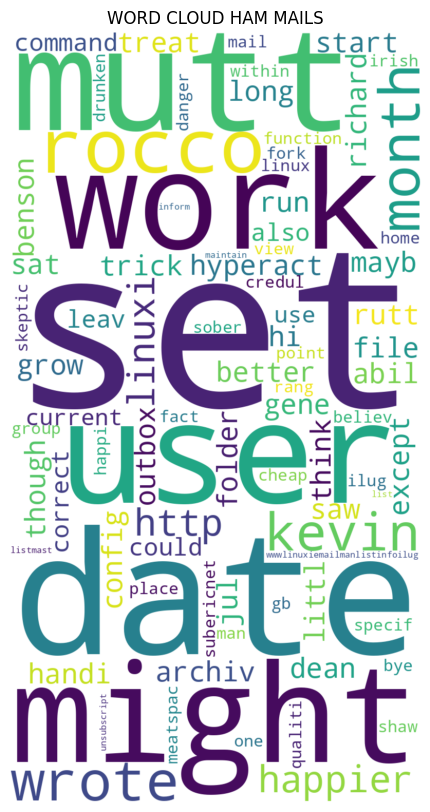

In [ ]:

words_filtered_phishing = filter_words(phishing)
text_phishing = " ".join([ele for ele in words_filtered_phishing])

wc_phishing = WordCloud(background_color="white", random_state=1, stopwords=stop_words, max_words=20000, width=800, height=1500)
wc_phishing.generate(text_phishing)

plt.figure(figsize=[10, 10])
plt.imshow(wc_phishing, interpolation="bilinear")
plt.axis('off')
plt.title("WORD CLOUD PHISHING MAILS")
plt.show()

words_filtered_ham = filter_words(ham)
text_ham = " ".join([ele for ele in words_filtered_ham])

wc_ham = WordCloud(background_color="white", random_state=1, stopwords=stop_words, max_words=20000, width=800, height=1500)
wc_ham.generate(text_ham)

plt.figure(figsize=[10, 10])
plt.imshow(wc_ham, interpolation="bilinear")
plt.axis('off')
plt.title("WORD CLOUD HAM MAILS")
plt.show()


In [ ]:
text_phishing

'tabl dear capit one bank custom internet inform technolog enabl us expand servic commit maintain trust custom place us protect privaci secur inform order protect inform unauthor access ident theft account fraud earnest ask updat profil also discov problem account inform temporari suspend access easi account updat inform get start pleas click link https onlinebankingcapitalonecomupdateindexhtml receiv notic author account holder pleas awar violat polici repres oneself anoth capit one bank user action may also violat local nation andor intern law capit one bank commit assist law enforc inquiri relat attempt misappropri person inform intent commit fraud theft inform provid request law enforc agenc ensur perpetr prosecut fullest extent law thank patienc work togeth maintain account secur regard capit one bank custom support center site direct made avail person unit state capit one bankcustom product servic describ well associ fee charg interest rate balanc requir may differ among geograph

In [ ]:
print(words_filtered_ham)

['saw', 'mutt', 'user', 'might', 'handi', 'trick', 'hyperact', 'archiv', 'gene', 'might', 'work', 'better', 'long', 'run', 'though', 'set', 'date', 'sat', 'jul', 'rocco', 'rutt', 'wrote', 'hi', 'dean', 'richard', 'benson', 'wrote', 'mutt', 'config', 'file', 'set', 'work', 'treat', 'except', 'start', 'grow', 'littl', 'month', 'think', 'mayb', 'abil', 'outbox', 'folder', 'command', 'correct', 'month', 'set', 'date', 'could', 'also', 'leav', 'current', 'use', 'function', 'view', 'mail', 'within', 'specif', 'date', 'rang', 'bye', 'rocco', 'kevin', 'kevin', 'subericnet', 'believ', 'happier', 'skeptic', 'fork', 'point', 'fact', 'drunken', 'man', 'happier', 'meatspac', 'place', 'home', 'sober', 'one', 'happi', 'credul', 'http', 'cheap', 'danger', 'qualiti', 'gb', 'shaw', 'irish', 'linux', 'user', 'group', 'ilug', 'linuxi', 'http', 'wwwlinuxiemailmanlistinfoilug', 'unsubscript', 'inform', 'list', 'maintain', 'listmast', 'linuxi']


### Mail Features extraction functions

#### Mail body features

In [ ]:


def cleanhtml(sentence): #function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext

def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned



def cleanBody(mail_body):
        filtered = []
        filtered_text = cleanpunc(cleanhtml(mail_body))
        word_tokens = word_tokenize(filtered_text)
        for w in word_tokens:
                if w not in stop_words and w.isalpha():
                    filtered.append(w)
        return filtered

def presenceHTML(mail):
    msg = email.message_from_string(mail)
    return int((msg.get_content_type() == 'text/html') == True)


def presenceHTMLFORM(message):
    return int((re.compile(r'<\s?\/?\s?form\s?>', re.IGNORECASE).search(message)
             != None) == True)


def presenceHTMLIFRAME(message):
    return int(re.compile(r'<\s?\/?\s?iframe\s?>',
                      re.IGNORECASE).search(message) != None) == True


def presenceJavaScript(message):
    return int(re.compile(r'<\s?\/?\s?script\s?>',
                      re.IGNORECASE).search(message) != None) == True


def presenceFlashContent(message):
    swflinks = re.compile(
        r"http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F])+).*\.swf",
        re.IGNORECASE).findall(message)
    flashObject = re.compile(r'embed\s*src\s*=\s*\".*\.swf\"',
                             re.IGNORECASE).search(message)
    return int((swflinks != None and len(swflinks) > 0) or (flashObject != None)) == True


def presenceGeneralSalutation(message):
    return int(re.compile(GENERAL_SALUTATION,re.IGNORECASE).search(message) != None) == True


def numberOfAttachments(raw_mail):
    try:
        mail = mailparser.parse_from_string(raw_mail)
        count = len(mail.attachments)
        return count
    except:
        return 0

def mail_to(mail_body):
    return int(re.compile(r'mailto:',
                      re.IGNORECASE).search(mail_body) != None) == True

def popups(mail_body):
    if re.compile(r'window.open|onclick',re.IGNORECASE).search(mail_body):
         return 1
    return 0

def body_richness(mail_body):
    mail_body = cleanBody(mail_body)
    if len(set(mail_body))!=0:
        return (len(mail_body)/len(set(mail_body)))
    else:
        return len(mail_body)

#### URL features

In [ ]:



def isURL(link):
    return re.compile(URLREGEX, re.IGNORECASE).search(link) is not None


def getURLs(mail_body):
    result = []
    cleanPayload = re.sub(r'\s+', ' ', mail_body)
    soup = BeautifulSoup(cleanPayload, 'html.parser')
    links = soup.find_all('a')
    i = 0
    for link in links:
        links[i] = link.get('href')
        i += 1

    for link in links:
        if isinstance(link, str) or isinstance(link, bytes):
            if isURL(link):
                result.append(link)
        else:
            continue

    urlregex = re.compile(URLREGEX_NOT_ALONE, re.IGNORECASE)
    links = urlregex.findall(cleanPayload)

    for link in links:
        if link not in result:
            result.append(link)

    res = list(OrderedDict.fromkeys(result))
    result = list(set(result))
    return result


def IPasURL(urls):
    result = []
    count = 0
    for url in urls:
        if re.compile(IPREGEX, re.IGNORECASE).search(url) and re.compile(IPREGEX, re.IGNORECASE).search(url).group(1) is not None:
            result.append(re.compile(IPREGEX, re.IGNORECASE).search(url).group(1))
            count += 1
    return count


def textLinkDisparity(mail_body):
    count = 0
    soup = BeautifulSoup(mail_body, 'html.parser')
    lists = soup.find_all('a')
    for item in lists:
        link = item.get('href')
        for string in item.stripped_strings:
            text = str(string)
            text = text.strip().replace('\n', '')
            text = text.strip().replace('\t', ' ')
            if isURL(text) and text != link:
                count += 1
    return count


def maliciousURL(urls):
    count = 0
    for url in urls:
        if ((re.compile(IPREGEX, re.IGNORECASE).search(url)
             is not None) == True or (len(re.compile(r'(https?://)',re.IGNORECASE).findall(url)) > 1)
                or (len(re.compile(r'(www.)',re.IGNORECASE).findall(url)) > 1)
                or (len(re.compile(r'(\.com|\.org|\.co)',re.IGNORECASE).findall(url)) > 1))== True:
            count += 1
    return count


def hexadecimalURL(urls):
    count = 0
    for url in urls:
        if ((re.compile(r'%[0-9a-fA-F]+', re.IGNORECASE).search(url)
             is not None) == True):
            count += 1
    return count



def extractDomains(urls):
    domain_set = set()
    for url in urls:
        domain = tldextract.extract(url).registered_domain
        if domain not in domain_set:
            domain_set.add(domain)
        else:
            continue

    return list(domain_set)


def domainCounts(url):
    domains = tldextract.extract(url)
    count = (len(re.compile(r'\.',re.IGNORECASE).findall( domains.subdomain))) + \
        ((len(re.compile(r'\.',re.IGNORECASE).findall( domains.domain)))+1)
    if re.compile(IPREGEX,re.IGNORECASE).search(domains.domain) is not None:
        count -= 3
    return (count)



def maxDomainsCounts(urls):
    count = 1
    for url in urls:
        count = max(domainCounts(url), count)
    return count

def at_in_url(urls):
    for url in urls:
        if (re.compile(r'@',re.IGNORECASE).search(url)):
            return 1
        else:
            continue
    return 0

import json
import ast

def writeCache():
    with open('/content/alexa_rank_cache.txt', 'w') as cache_file:
        cache_file.write(json.dumps(alexa_rank_cache))
    print("Cache written")



def loadCache():
    global alexa_rank_cache
    try:
        with open('/content/alexa_rank_cache.txt', 'r') as cache_file:
            cache = ast.literal_eval(cache_file.read())
            alexa_rank_cache = cache
            print("Cache loaded")
    except FileNotFoundError:
        print("Warning: No Alexa rank cache found")



#### Subject line features

In [ ]:
def subject_richness(subject):
    if subject is None:
        return 0
    else:
        texts = str(subject).split()
        return len(set(texts)) if len(set(texts)) else len(texts)

def contains_verify(subject):
    if subject is None:
        return 0
    else:
        return int('verify' in str(subject).lower())

def contains_update(subject):
    if subject is None:
        return 0
    else:
        return int('update' in str(subject).lower())

def contains_access(subject):
    if subject is None:
        return 0
    else:
        return int('access' in str(subject).lower())

def contains_prime_targets(subject):
    if subject is None:
        return 0
    else:
        return int(any(substring in str(subject).lower() for substring in ['bank', 'paypal', 'ebay', 'amazon']))

def contains_account(subject):
    if subject is None:
        return 0
    else:
        return int('account' in str(subject).lower())

def contains_suspended(subject):
    if subject is None:
        return 0
    else:
        return int(any(substring in str(subject).lower() for substring in ['closed', 'expiration', 'suspended', 'terminate', 'restricted']))

def contains_password(subject):
    if subject is None:
        return 0
    else:
        return int('password' in str(subject).lower())

def contains_urgent(subject):
    if subject is None:
        return 0
    else:
        return int('urgent' in str(subject).lower())

def number_of_dots(headers):
    sender = headers.get("From", headers.get("from", ""))
    return str(sender).count('.')

def number_of_dash(headers):
    sender = headers.get("From", headers.get("from", ""))
    return str(sender).count('-')


#### Sender's address features

In [ ]:
def number_of_dots(headers):
    sender = headers.get("From", headers.get("from", ""))
    if isinstance(sender, str):
        return len(re.compile(r'\.',re.IGNORECASE).findall(sender))
    else:
        return 0

def number_of_dash(headers):
    sender = headers.get("From", headers.get("from", ""))
    if isinstance(sender, str):
        return len(re.compile(r'\-',re.IGNORECASE).findall(sender))
    else:
        return 0



In [ ]:
import pandas as pd

def create_feature_dataframe(emails):
    # Create a list to store the feature data for each email
    feature_data = []

    for email in emails:
        email_body = get_email_body(email)
        urls = getURLs(email_body)
        subject = email["Subject"]
        headers = dict(email.items())  # convert list of tuples into a dictionary

        # Create a dictionary to store the features for this email
        features = {}

        # Calculate the features and add them to the dictionary
        features['number_of_dots'] = number_of_dots(headers)
        features['number_of_dash'] = number_of_dash(headers)
        features['subject_richness'] = subject_richness(subject)
        features['contains_verify'] = contains_verify(subject)
        features['contains_update'] = contains_update(subject)
        features['contains_access'] = contains_access(subject)
        features['contains_prime_targets'] = contains_prime_targets(subject)
        features['contains_account'] = contains_account(subject)
        features['contains_suspended'] = contains_suspended(subject)
        features['contains_password'] = contains_password(subject)
        features['contains_urgent'] = contains_urgent(subject)

        # Extract URLs from the mail_body
        urls = getURLs(email_body)

        features['IPasURL'] = IPasURL(urls)
        features['textLinkDisparity'] = textLinkDisparity(email_body)
        features['maliciousURL'] = maliciousURL(urls)
        features['hexadecimalURL'] = hexadecimalURL(urls)
        features['maxDomainsCounts'] = maxDomainsCounts(urls)
        features['at_in_url'] = at_in_url(urls)
        features['presenceHTML'] = presenceHTML(email_body)
        features['presenceHTMLFORM'] = presenceHTMLFORM(email_body)
        features['presenceHTMLIFRAME'] = presenceHTMLIFRAME(email_body)
        features['presenceJavaScript'] = presenceJavaScript(email_body)
        features['presenceFlashContent'] = presenceFlashContent(email_body)
        features['presenceGeneralSalutation'] = presenceGeneralSalutation(email_body)
        features['numberOfAttachments'] = numberOfAttachments(email_body)
        features['mail_to'] = mail_to(email_body)
        features['popups'] = popups(email_body)
        features['body_richness'] = body_richness(email_body)

        # Add the feature dictionary to the list
        feature_data.append(features)

    # Convert the list of feature dictionaries into a DataFrame
    df = pd.DataFrame(feature_data)

    return df
# Create feature dataframes for the datasets
phishing_df = create_feature_dataframe(phishing)
ham_df = create_feature_dataframe(ham)
hard_ham_df = create_feature_dataframe(hard_ham)

# Add labels to the dataframes
phishing_df['label'] = 1  # phishing emails are labeled as 1
ham_df['label'] = 0  # ham emails are labeled as 0
hard_ham_df['label'] = 0  # hard ham emails are also labeled as 0

# Combine the dataframes
all_df = pd.concat([phishing_df, ham_df, hard_ham_df], ignore_index=True)

ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO User 24@zdronc1.info@67.117.244.202 with login by smtp105.biz.mail.mud.yahoo.com with SMTP; 4 Oct 2006 14:44:01 -0000
ERROR:mailparser.utils:More than one match found for (?:with(?! cipher)\s+(?P<with>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+by|\s+id|\s+for|\s+via|;)) in from unknown HELO User 24@zdronc1.info@67.117.244.202 with login by smtp105.biz.mail.mud.yahoo.com with SMTP; 4 Oct 2006 14:44:01 -0000
ERROR:mailparser.utils:More than one match found for (?:by\s+(?P<by>.+?)(?:\s*[(]?envelope-from|\s*[(]?envelope-sender|\s+from|\s+with(?! cipher)|\s+id|\s+for|\s+via|;)) in from serendipitous.nelvac.com ehlo gammae.com.sexyrussianmodels.com 26.92.24.16 by topdepo.com with SMTP id 90Q0OFJ9BY for <user@example.com>; Thu, 31 Aug 2006 20:11:16 -0800
ERROR:mailparser.utils:More th

UnicodeDecodeError occurred while parsing the mail. Trying a different approach...
UnicodeDecodeError occurred while parsing the mail. Trying a different approach...


In [ ]:
all_df.head(5)

,number_of_dots,number_of_dash,subject_richness,contains_verify,contains_update,contains_access,contains_prime_targets,contains_account,contains_suspended,contains_password,...,presenceHTMLFORM,presenceHTMLIFRAME,presenceJavaScript,presenceFlashContent,presenceGeneralSalutation,numberOfAttachments,mail_to,popups,body_richness,label
0,1,0,5,0,0,0,1,0,0,0,...,0,False,False,False,True,0,False,0,1.363636,1
1,1,0,5,0,0,0,0,1,0,0,...,0,False,False,False,False,0,False,0,2.932203,1
2,3,0,6,0,0,0,0,0,0,0,...,0,False,False,False,False,0,False,0,1.611111,1
3,1,0,6,0,0,0,0,0,0,0,...,0,False,False,False,False,0,False,0,1.862903,1
4,1,0,15,0,0,0,0,0,0,0,...,0,False,False,False,False,0,False,1,2.707182,1


dont use i have another function

In [ ]:
# First, create a new column that is the sum of all the other columns
all_df['sum'] = all_df.sum(axis=1)

# Then, find the row with the maximum sum
most_positive_row = all_df[all_df['sum'] == all_df['sum'].max()]

# Print the most positive row
most_positive_row.head(20)
# Find rows where both 'isRepliedMail' and 'isForwardedMail' are True


,number_of_dots,number_of_dash,subject_richness,contains_verify,contains_update,contains_access,contains_prime_targets,contains_account,contains_suspended,contains_password,...,presenceHTMLIFRAME,presenceJavaScript,presenceFlashContent,presenceGeneralSalutation,numberOfAttachments,mail_to,popups,body_richness,label,sum
3212,1,0,6,0,0,0,0,0,0,0,...,False,True,False,False,0,False,1,2.366154,0,89.366154


In [ ]:
all_df.columns

Index(['number_of_dots', 'number_of_dash', 'subject_richness',
       'contains_verify', 'contains_update', 'contains_access',
       'contains_prime_targets', 'contains_account', 'contains_suspended',
       'contains_password', 'contains_urgent', 'IPasURL', 'textLinkDisparity',
       'maliciousURL', 'hexadecimalURL', 'maxDomainsCounts', 'at_in_url',
       'presenceHTML', 'presenceHTMLFORM', 'presenceHTMLIFRAME',
       'presenceJavaScript', 'presenceFlashContent',
       'presenceGeneralSalutation', 'numberOfAttachments', 'mail_to', 'popups',
       'body_richness', 'label', 'sum'],
      dtype='object')

In [ ]:
rows = all_df[(all_df['contains_prime_targets'] == True) & (all_df['hexadecimalURL'] == True)]
rows2 = all_df[(all_df['maliciousURL'] == True) & (all_df['presenceJavaScript'] == True)]
# Print the rows
rows.head(10)
# Print the rows
print()
rows2.head(10)



,number_of_dots,number_of_dash,subject_richness,contains_verify,contains_update,contains_access,contains_prime_targets,contains_account,contains_suspended,contains_password,...,presenceHTMLIFRAME,presenceJavaScript,presenceFlashContent,presenceGeneralSalutation,numberOfAttachments,mail_to,popups,body_richness,label,sum
160,1,1,2,0,0,0,0,0,0,0,...,False,True,False,True,0,False,0,3.193548,1,15.193548
168,2,0,4,0,0,0,0,1,0,0,...,False,True,False,True,0,False,0,2.878261,1,14.878261
196,1,1,4,0,0,0,1,0,0,0,...,False,True,False,False,0,False,1,3.265537,1,17.265537
228,2,0,4,0,0,0,0,1,0,0,...,False,True,False,True,0,False,0,2.878261,1,14.878261
229,1,1,4,0,0,0,1,0,0,0,...,False,True,False,False,0,False,1,3.265537,1,17.265537
249,1,1,11,0,0,0,0,1,0,0,...,False,True,False,False,0,False,0,1.811321,1,22.811321
289,1,1,4,0,0,0,1,0,0,0,...,False,True,False,False,0,False,1,3.265537,1,17.265537
317,2,2,2,0,0,0,0,0,0,0,...,False,True,False,False,0,False,1,2.476923,1,15.476923
535,1,1,4,0,0,0,1,0,0,0,...,False,True,False,False,0,False,1,3.265537,1,17.265537
556,2,0,3,0,1,0,0,1,0,0,...,False,True,False,False,0,False,1,1.721519,1,15.721519


In [ ]:
# Write DataFrame to CSV
all_df.to_csv('data.csv', index=False)


In [ ]:
mails = pd.read_csv("data.csv")
print("Number of Ham class records: ",len(mails[mails['label'] == 1]))
print("Number of Phishing class records: ",len(mails[mails['label'] == 0]))

Number of Ham class records:  1631
Number of Phishing class records:  1651


## Split Training and Testing data

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import pandas as pd
le = preprocessing.LabelEncoder()
mails = pd.read_csv("data.csv")

labels=le.fit_transform(mails['label'])

mails.drop('label',axis =1,inplace=True)



X_train, X_test, Y_train, Y_test = train_test_split(mails,
                                                    labels,
                                                    test_size=0.20,
                                                    stratify=labels,
                                                    random_state=332)
# check dataset shapes
print(X_train.shape, (Y_train).shape)


(2625, 28) (2625,)


## Exploratory Data Analysis

### Checking dataset

In [ ]:
mails = X_train.copy(deep=True)
mails['Class'] =  pd.Series(Y_train, index=mails.index)

mails.describe()

,number_of_dots,number_of_dash,subject_richness,contains_verify,contains_update,contains_access,contains_prime_targets,contains_account,contains_suspended,contains_password,...,hexadecimalURL,maxDomainsCounts,at_in_url,presenceHTML,presenceHTMLFORM,numberOfAttachments,popups,body_richness,sum,Class
count,2625.000000,2625.000000,2625.000000,2625.000000,2625.000000,2625.000000,2625.000000,2625.000000,2625.000000,2625.000000,...,2625.000000,2625.000000,2625.000000,2625.0,2625.000000,2625.0,2625.000000,2625.000000,2625.000000,2625.000000
mean,1.637714,0.233524,6.164952,0.006095,0.059048,0.041524,0.241524,0.176000,0.009143,0.001905,...,0.114286,1.606476,0.032381,0.0,0.040381,0.0,0.033143,1.564015,13.842111,0.497143
std,0.985502,0.534571,2.843449,0.077849,0.235759,0.199536,0.428089,0.380893,0.095198,0.043610,...,0.536657,1.159612,0.177043,0.0,0.196889,0.0,0.179044,0.718762,5.605578,0.500087
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,1.000000,0.000000
25%,1.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.0,0.000000,0.0,0.000000,1.219512,9.812500,0.000000
50%,1.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.0,0.000000,0.0,0.000000,1.388889,13.058824,0.000000
75%,2.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,2.000000,0.000000,0.0,0.000000,0.0,0.000000,1.669492,17.187648,1.000000
max,8.000000,7.000000,37.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,11.000000,9.000000,1.000000,0.0,1.000000,0.0,1.000000,20.250000,70.510323,1.000000


In [ ]:
#checking for missing values
# print(mails.isnull().sum())
print("Number of Ham class records: ",len(mails[mails['Class'] == 0]))
print("Number of Phishing class records: ",len(mails[mails['Class'] == 1]))


Number of Ham class records:  1320
Number of Phishing class records:  1305


### Heatmap

<Axes: >

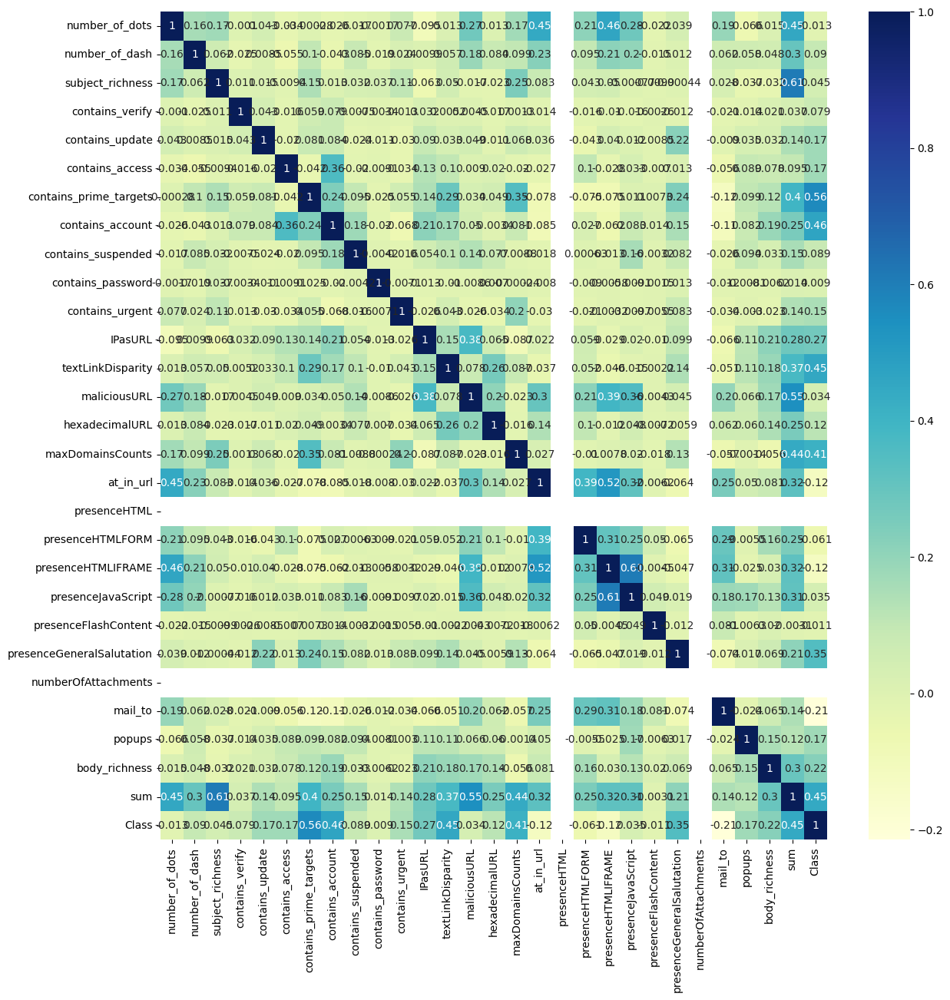

In [ ]:
%matplotlib inline
plt.figure(figsize = (14,14))
sns.heatmap(mails.corr(),annot=True,cmap="YlGnBu")


As I can interpret from the heatmap shown in Figure 12, there is no such very strong correlation between features but I have decent correlation between:
- JavaScript and Iframe
- Iframe and @_in_url
- Text link disparity and maximum domains counts
- IP URLs and Number of URLs
- Malicious URL and Number of URLs <br>
These correlations are quite obvious trend revealed in the heatmap. As number of URLs increases the mail tend to be more malicious and have IP URLs. It also reveals that if a mail has many domains it is much likely to have text link disparity.

### Visualization: Matplotlib

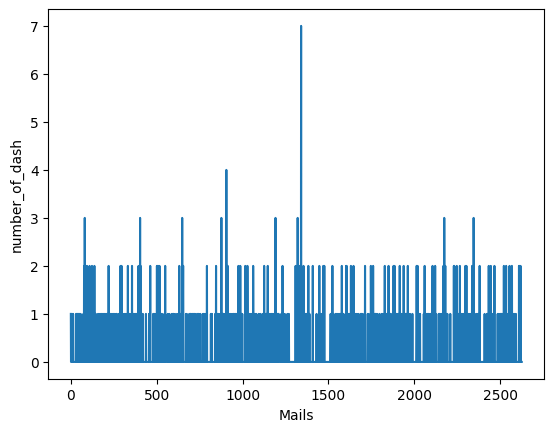

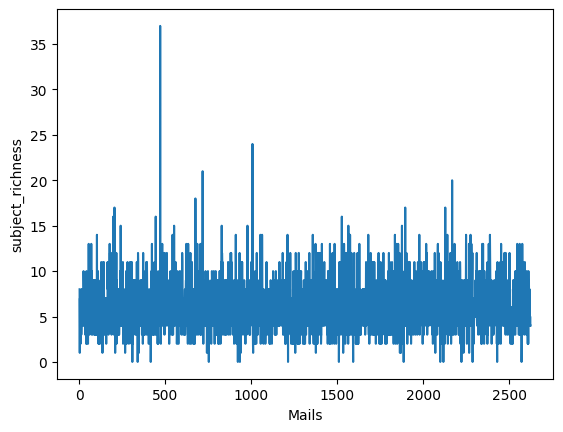

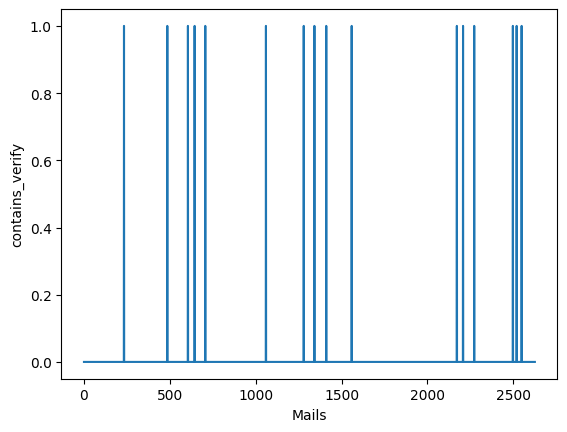

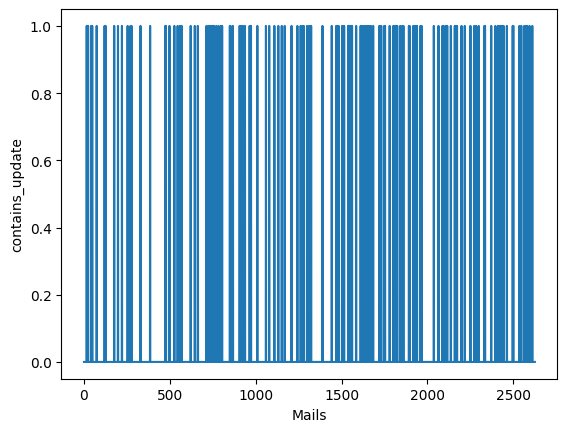

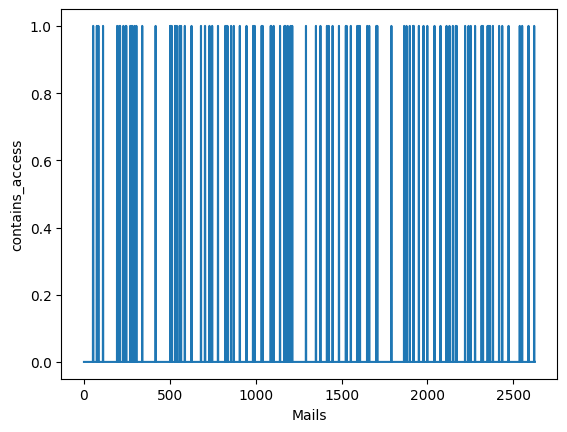

...

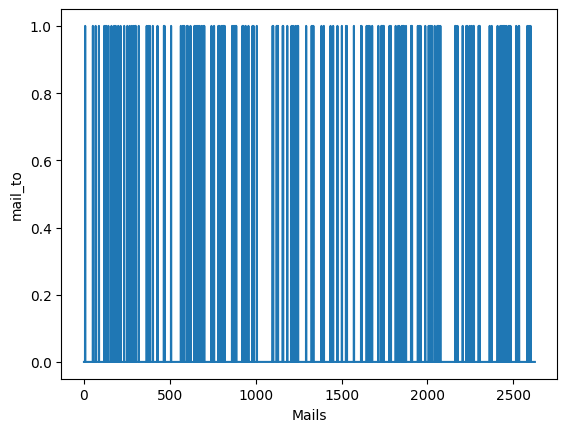

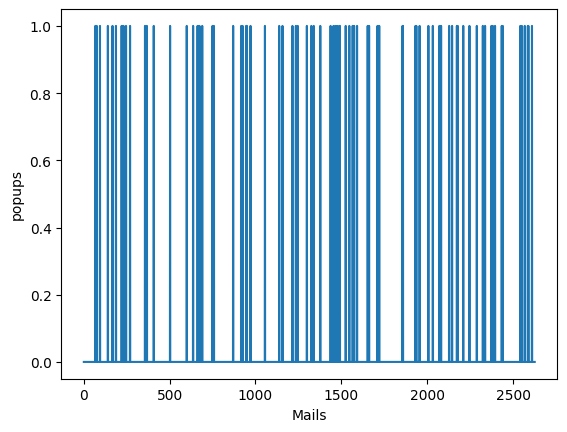

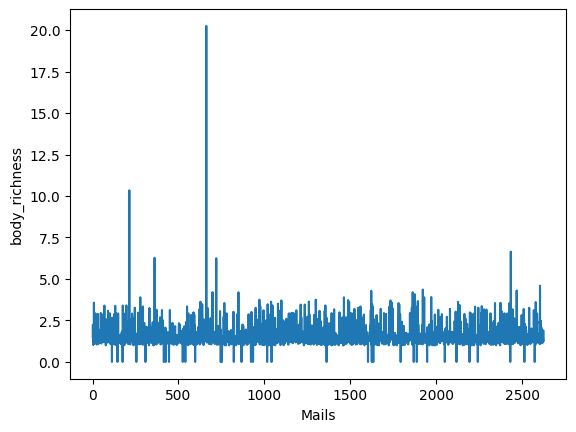

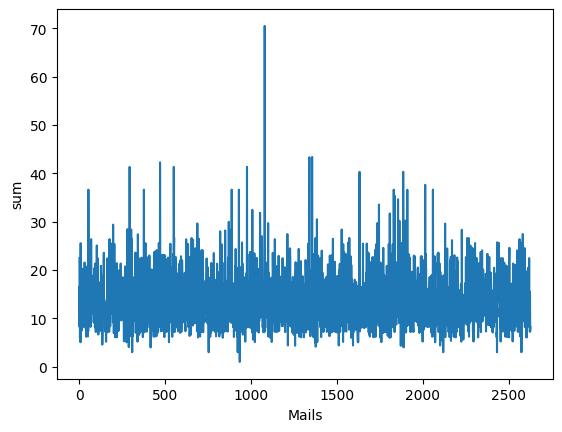

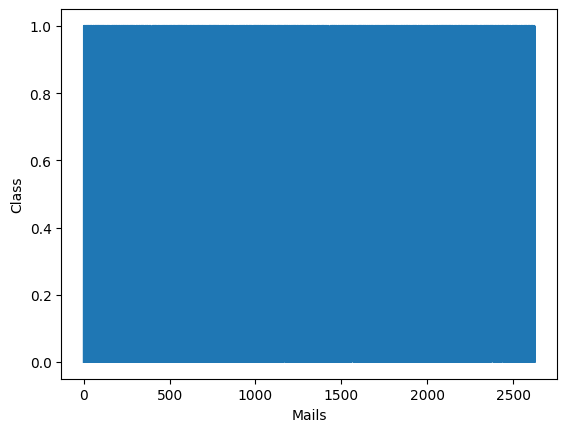

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


def visualize_data():
        feature_val = np.array(mails).T
        fields = mails.columns
        xpoints = np.arange(1,len(mails)+1,1)
        for i in range(1,len(fields),1):
            ypoints = np.array(feature_val[i])
            plt.ylabel(fields[i])

            plt.xlabel("Mails")
            plt.plot(xpoints, ypoints)
            plt.show()

visualize_data()


### Principal Component Analysis

#### PCA for visualization

Here, I can see that clusters are forming which means there is a separation between the both classes but I can also see the blue points which represent mixing presence of both classes and it means often time phishing mail are most like the **ham** mails.

(2625, 28)


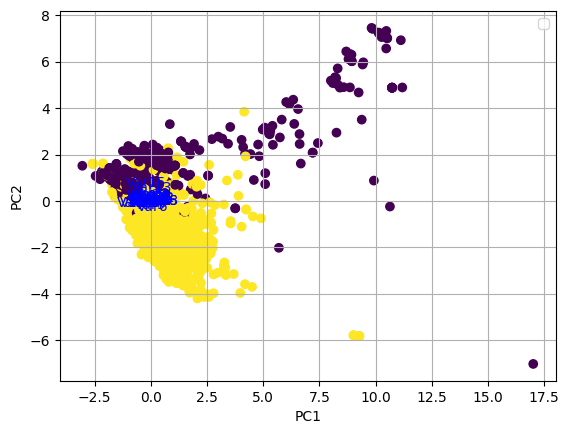

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


#In general it is a good idea to scale the data
scaler = StandardScaler()
X =  X_train.copy(deep=True)
y = Y_train.copy()
scaler.fit(X)
X=scaler.transform(X)

pca = PCA()
pca.fit(X,y)
x_new = pca.transform(X)
print(x_new.shape)
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]

    plt.scatter(xs ,ys, c = y) #without scaling
    for i in range(n):
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'b', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'r', ha = 'center', va = 'center')

plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
plt.legend()
plt.grid()

#Call the function.
myplot(x_new[:,0:3], pca.components_)
plt.show()

In [ ]:
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np


model = PCA(n_components=4).fit(X_train)
X_pc = model.transform(X_train)

# number of components
n_pcs= model.components_.shape[0]

# get the index of the most important feature on EACH component
# LIST COMPREHENSION HERE
most_important = [np.abs(model.components_[i]).argmax() for i in range(n_pcs)]

# get the names
most_important_names = [X_train.columns[most_important[i]] for i in range(n_pcs)]

# LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

# build the dataframe
df = pd.DataFrame(dic.items())
df

,0,1
0,PC0,sum
1,PC1,subject_richness
2,PC2,maliciousURL
3,PC3,maxDomainsCounts


### Feature Selection

In [ ]:
## Remove features with missing values
X_train.isnull().any().any()

False

#### Variance Filter

In [ ]:
from sklearn.feature_selection import VarianceThreshold

sel = VarianceThreshold(threshold=(0.12))
sel.fit(X_train)
cols = sel.get_support(indices=True)
features_df_new = X_train.iloc[:,cols]
Selected_features_VarianceFilter = features_df_new.columns
Selected_features_VarianceFilter

Index(['number_of_dots', 'number_of_dash', 'subject_richness',
       'contains_prime_targets', 'contains_account', 'IPasURL',
       'textLinkDisparity', 'maliciousURL', 'hexadecimalURL',
       'maxDomainsCounts', 'body_richness', 'sum'],
      dtype='object')

In [ ]:
Filtered = X_train[Selected_features_VarianceFilter]

#### Feature Importance with Random Forest Regressor

In [ ]:
from sklearn.ensemble import RandomForestClassifier
X_trainn = Filtered
model = RandomForestClassifier(random_state=42, max_depth=10)
model.fit(X_trainn,Y_train)

RandomForestClassifier(max_depth=10, random_state=42)

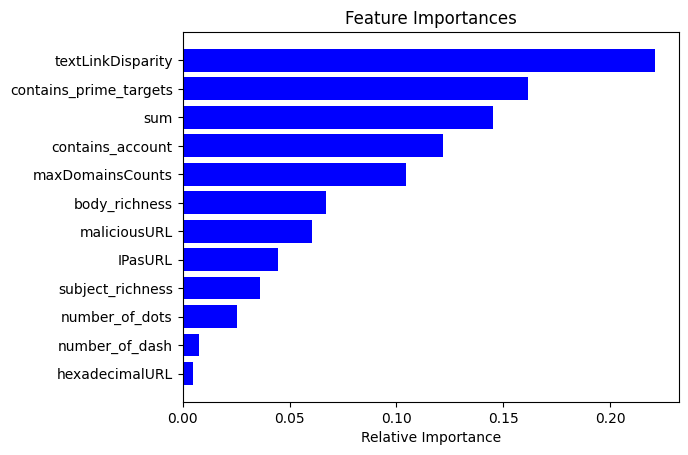

['textLinkDisparity',
 'contains_prime_targets',
 'sum',
 'contains_account',
 'maxDomainsCounts',
 'body_richness',
 'maliciousURL',
 'IPasURL',
 'subject_richness',
 'number_of_dots',
 'number_of_dash',
 'hexadecimalURL']

In [ ]:
features = X_trainn.columns
importances = model.feature_importances_
indices = np.argsort(importances)[-13:]  # top 10 features

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

Selected_features_RandomForestClassifier = [features[index] for index in indices]
Selected_features_RandomForestClassifier.reverse()
Selected_features_RandomForestClassifier

#### Univariate using SelectKBest

In [ ]:
#UNIVARIATE
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
X, y = X_train, Y_train
selector = SelectKBest(chi2, k=11)
selector.fit(X,y)
# sel.scores_
cols = selector.get_support(indices=True)
features_df_new = X_train.iloc[:,cols]
Selected_features_Univariate = features_df_new.columns
Selected_features_Univariate

Index(['contains_access', 'contains_prime_targets', 'contains_account',
       'IPasURL', 'textLinkDisparity', 'hexadecimalURL', 'maxDomainsCounts',
       'presenceGeneralSalutation', 'mail_to', 'popups', 'sum'],
      dtype='object')

UNION ALL SELECTED CANDIDATES

In [ ]:
# Selected_features = ((Selected_features_RandomForestClassifier + Selected_features_Univariate) + Selected_features_VarianceFilter)
# # len(set(Selected_features))
Selected_features = []
Selected_features.extend(Selected_features_RandomForestClassifier)
Selected_features.extend(Selected_features_Univariate)
Selected_features.extend(Selected_features_VarianceFilter)
Selected_features = set(Selected_features)
Selected_features

{'IPasURL',
 'body_richness',
 'contains_access',
 'contains_account',
 'contains_prime_targets',
 'hexadecimalURL',
 'mail_to',
 'maliciousURL',
 'maxDomainsCounts',
 'number_of_dash',
 'number_of_dots',
 'popups',
 'presenceGeneralSalutation',
 'subject_richness',
 'sum',
 'textLinkDisparity'}

#### High Correlation Filter

<Axes: >

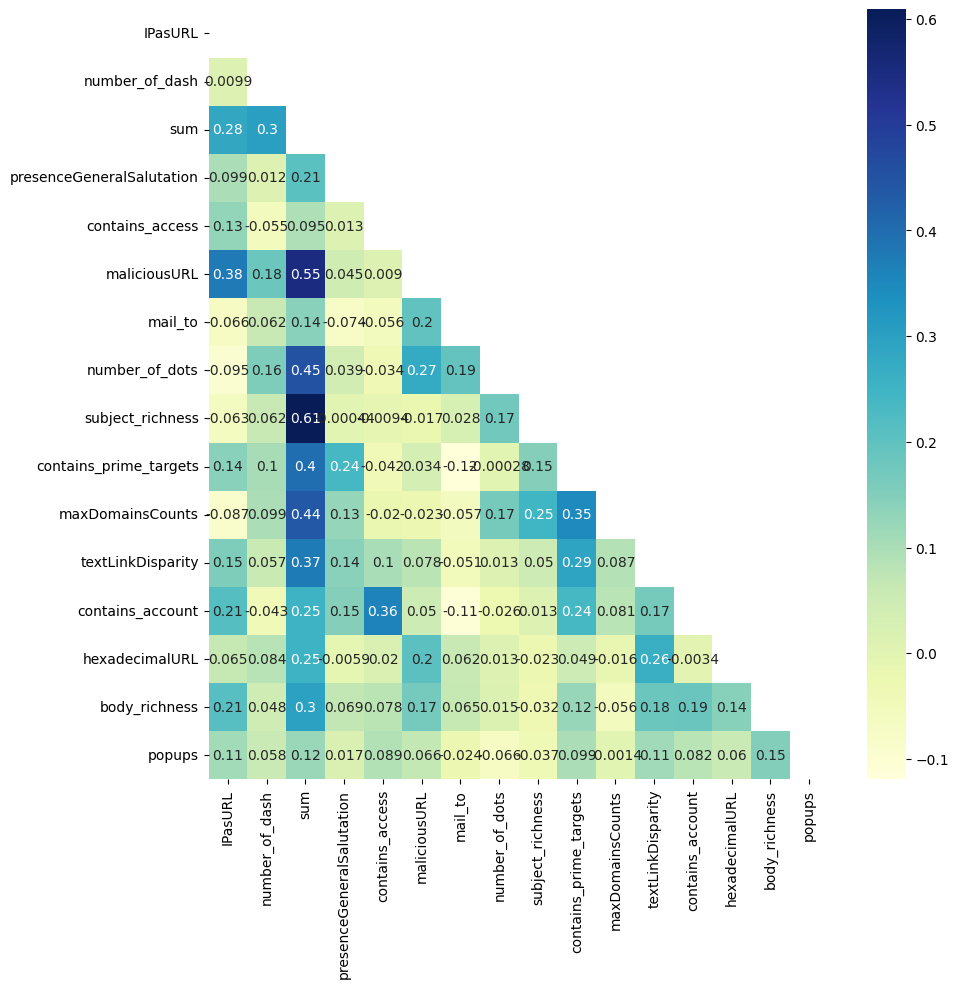

In [ ]:
Filtered = X_train[Selected_features]
plt.figure(figsize = (10,10))
# creating mask
mask = np.triu(np.ones_like(Filtered.corr()))


sns.heatmap(Filtered.corr(),annot=True,cmap="YlGnBu", mask=mask)


In [ ]:
Selected_features

{'IPasURL',
 'body_richness',
 'contains_access',
 'contains_account',
 'contains_prime_targets',
 'hexadecimalURL',
 'mail_to',
 'maliciousURL',
 'maxDomainsCounts',
 'number_of_dash',
 'number_of_dots',
 'popups',
 'presenceGeneralSalutation',
 'subject_richness',
 'sum',
 'textLinkDisparity'}

This reveals that there is decent correlation between
- Number of URLs and IP URLs
- Maximum Domain Counts and Attachments
- Number of URLs and Malicious URLs
<br>We as until now I have 17 features and sacrificing 3 features would be not much beneficial, we will preserve this information.

Finally,we have all the **15 features selected for next phase i.e. model building.**

## Selecting Best Classifiers

In [ ]:
#Metrics
from sklearn.metrics import make_scorer, accuracy_score,precision_score,log_loss
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score ,precision_score,recall_score,f1_score,balanced_accuracy_score
from sklearn.metrics import matthews_corrcoef,roc_auc_score

#Model Select
from sklearn.model_selection import KFold,train_test_split,cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import  LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import linear_model
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from mlxtend.plotting import plot_confusion_matrix
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold


In [ ]:
X_train = X_train[Selected_features]
X_test = X_test[Selected_features]
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [ ]:
def training_and_cross_validation(model):

    X = X_train
    y = Y_train

    skf = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)

    accuracy_list = []
    conf_matrix_list = []

    for train_index, test_index in skf.split(X, y):
        Xtrain, Xtest = X[train_index], X[test_index]
        ytrain, ytest = y[train_index], y[test_index]

        Xtrain = sc.fit_transform(Xtrain)
        Xtest = sc.transform(Xtest)
        model.fit(Xtrain, ytrain)
        predictions = model.predict(Xtest)
        accuracy = accuracy_score(ytest, predictions)
        accuracy_list.append(accuracy)
        CM=confusion_matrix(ytest, predictions)
        conf_matrix_list.append(CM)

    avg_conf_matrix = np.array((pd.DataFrame(np.ceil(np.mean(conf_matrix_list, axis=0)))).astype(int))

    labels =['Ham','Phishing']

    fig, ax = plot_confusion_matrix(conf_mat=avg_conf_matrix,figsize=(4,4),
                                    show_absolute=True,
                                    show_normed=True,
                                    colorbar=True)
    ax.set_xticklabels([''] + labels)
    ax.set_yticklabels([''] + labels)
    plt.title("Average Confusion Matrix after 10 fold validation ")
#     plt.show()
    print('\n')
    mean_accuracy = np.mean(accuracy_list)
    print("Total Average Accuracy is ",np.round(mean_accuracy*100,4),"%")
    return model

In [ ]:
MCC = {}
LOG_LOSS = {}
BALANCED_ACCURACY = {}
ACCURACY = {}
F1 = {}
ROC_AUC = {}
REPORT = {}
MODEL = []

In [ ]:

def show_performance_metrics(model,name,Xtest=X_test):
    predictions = model.predict(Xtest)


    if name == 'Voting Classifier(hard voting)':
            ll = 'N/A'
    else:
        train_predictions = model.predict_proba(Xtest)
        ll = log_loss(Y_test, train_predictions)
        ll = np.round((ll),3)


    report = classification_report(Y_test, predictions,labels=[0,1],digits=4)
    mcc = np.round(matthews_corrcoef(Y_test,predictions),3)

    roc_auc = np.round(roc_auc_score(Y_test, predictions)*100,3)
    accuracy = np.round(accuracy_score(Y_test, predictions)*100,3)
    balanced_accuracy = np.round(balanced_accuracy_score(Y_test, predictions)*100,3)
    f1 = np.round(f1_score(Y_test, predictions)*100,3)
    MCC[name] = mcc
    LOG_LOSS[name] = ll
    BALANCED_ACCURACY[name] = balanced_accuracy
    ACCURACY[name] = accuracy
    F1[name] = f1
    ROC_AUC[name] = roc_auc
    REPORT[name] = report
    labels = ["Ham","Phishing"]
    fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(Y_test,predictions),figsize=(4,4),
                                    show_absolute=True,
                                    show_normed=True,
                                    colorbar=True)
    ax.set_xticklabels([''] + labels)
    ax.set_yticklabels([''] + labels)
    title = "Confusion Matrix : "+name
    plt.title(title)
    plt.show()
    print(report)
    print("MCC: ",mcc)
    print("Log Loss: ",ll)
    print('f1: ',f1)
    print('Balanced Accuracy: ',balanced_accuracy)
    print('Accuracy: ',accuracy)
    print('ROC_AUC : ', roc_auc)

In [ ]:
# Libraries
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve

In [ ]:
# Cross validate model with Kfold stratified cross validation
kfold = StratifiedKFold(n_splits=10)
MODEL=[]

I have selected best five classifiers out of 11 classifiers as stated in previous section. I went ahead with using cross validation score to select best five classifiers which would be fine-tuned in later stage. As the dataset is slightly imbalanced I have selected f1 score as scoring for cross validation score

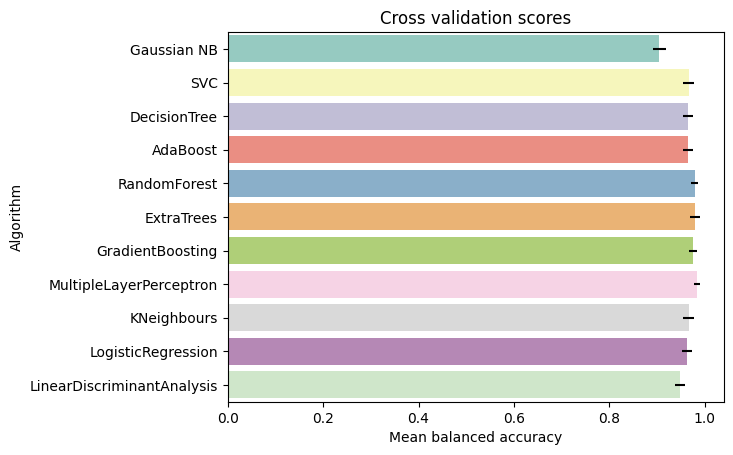

In [ ]:
# Test all the above stated algorithms
random_state = 2
classifiers = []
classifiers.append(GaussianNB())
classifiers.append(SVC(random_state=random_state))
classifiers.append(DecisionTreeClassifier(random_state=random_state))
classifiers.append(AdaBoostClassifier(DecisionTreeClassifier(random_state=random_state),random_state=random_state,learning_rate=0.1))
classifiers.append(RandomForestClassifier(random_state=random_state))
classifiers.append(ExtraTreesClassifier(random_state=random_state))
classifiers.append(GradientBoostingClassifier(random_state=random_state))
classifiers.append(MLPClassifier(random_state=random_state))
classifiers.append(KNeighborsClassifier())
classifiers.append(LogisticRegression(random_state = random_state))
classifiers.append(LinearDiscriminantAnalysis())
cv_results = []
for classifier in classifiers :
    cv_results.append(cross_val_score(classifier, X_train, y = Y_train, scoring = "balanced_accuracy", cv = kfold, n_jobs=4))
cv_means = []
cv_std = []
for cv_result in cv_results:
    cv_means.append(cv_result.mean())
    cv_std.append(cv_result.std())
cv_res = pd.DataFrame({"CrossValMeans":cv_means,"CrossValerrors": cv_std,"Algorithm":["Gaussian NB","SVC","DecisionTree","AdaBoost",
"RandomForest","ExtraTrees","GradientBoosting","MultipleLayerPerceptron","KNeighbours","LogisticRegression","LinearDiscriminantAnalysis"]})

g = sns.barplot(x="CrossValMeans", y="Algorithm", data=cv_res, palette="Set3", orient="h", xerr=cv_std)
g.set_xlabel("Mean balanced accuracy")
g = g.set_title("Cross validation scores")


- SVC
- Logistic Regression
- Random Forest Classifier
- ExtraTrees Classifier
- Gradient Boosting


## Machine Learning Models

### Logistic Regression



Total Average Accuracy is  96.1905 %


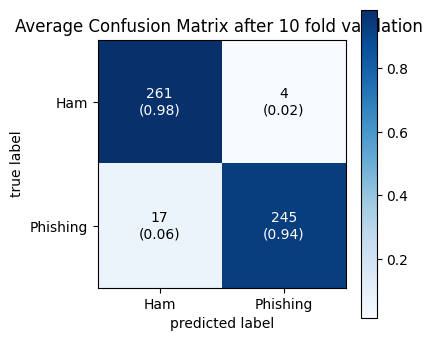

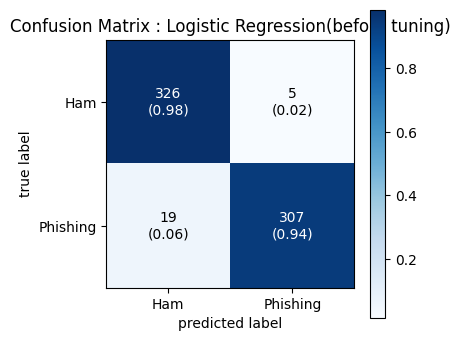

              precision    recall  f1-score   support

           0     0.9449    0.9849    0.9645       331
           1     0.9840    0.9417    0.9624       326

    accuracy                         0.9635       657
   macro avg     0.9645    0.9633    0.9634       657
weighted avg     0.9643    0.9635    0.9634       657

MCC:  0.928
Log Loss:  0.166
f1:  96.238
Balanced Accuracy:  96.331
Accuracy:  96.347
ROC_AUC :  96.331


In [ ]:
lr = LogisticRegression()
lr = training_and_cross_validation(lr)
MODEL.append("Logistic Regression(before tuning)")
show_performance_metrics(lr,MODEL[-1])



Total Average Accuracy is  98.2857 %


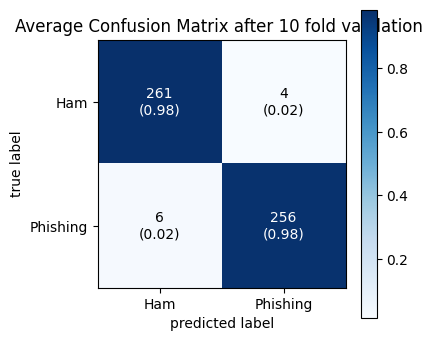

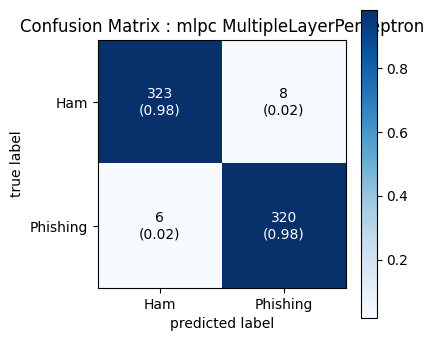

              precision    recall  f1-score   support

           0     0.9818    0.9758    0.9788       331
           1     0.9756    0.9816    0.9786       326

    accuracy                         0.9787       657
   macro avg     0.9787    0.9787    0.9787       657
weighted avg     0.9787    0.9787    0.9787       657

MCC:  0.957
Log Loss:  0.115
f1:  97.859
Balanced Accuracy:  97.871
Accuracy:  97.869
ROC_AUC :  97.871


In [ ]:
mlpc = MLPClassifier()
mlpc = training_and_cross_validation(mlpc)
MODEL.append("mlpc MultipleLayerPerceptron")
show_performance_metrics(mlpc,MODEL[-1])

### SVC



Total Average Accuracy is  96.4952 %


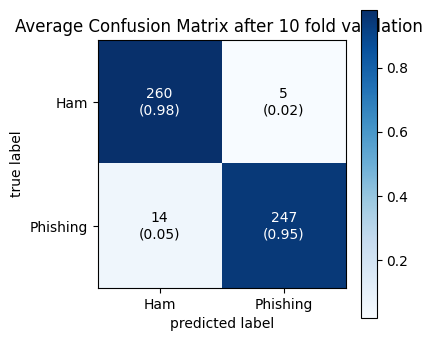

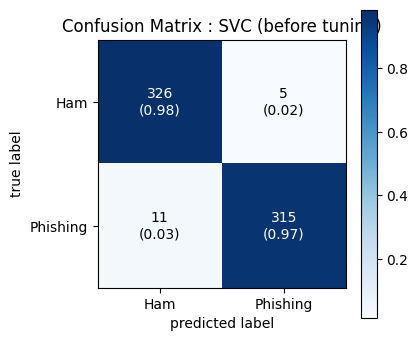

              precision    recall  f1-score   support

           0     0.9674    0.9849    0.9760       331
           1     0.9844    0.9663    0.9752       326

    accuracy                         0.9756       657
   macro avg     0.9759    0.9756    0.9756       657
weighted avg     0.9758    0.9756    0.9756       657

MCC:  0.951
Log Loss:  0.08
f1:  97.523
Balanced Accuracy:  97.558
Accuracy:  97.565
ROC_AUC :  97.558


In [ ]:
svc = SVC(probability=True)
svc = training_and_cross_validation(svc)
MODEL.append('SVC (before tuning)')
show_performance_metrics(svc,MODEL[-1])

### Gradient Boosting



Total Average Accuracy is  97.3333 %


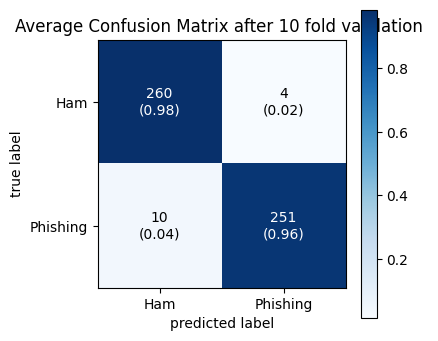

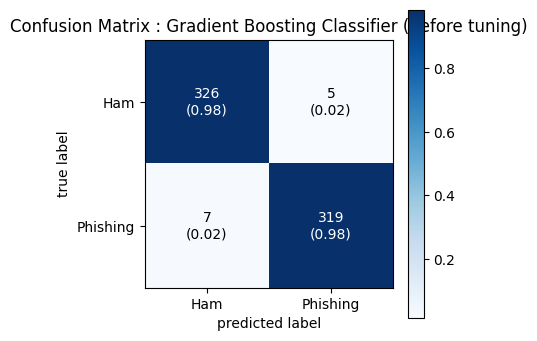

              precision    recall  f1-score   support

           0     0.9790    0.9849    0.9819       331
           1     0.9846    0.9785    0.9815       326

    accuracy                         0.9817       657
   macro avg     0.9818    0.9817    0.9817       657
weighted avg     0.9818    0.9817    0.9817       657

MCC:  0.963
Log Loss:  0.074
f1:  98.154
Balanced Accuracy:  98.171
Accuracy:  98.174
ROC_AUC :  98.171


In [ ]:
gbc = GradientBoostingClassifier()
gbc = training_and_cross_validation(gbc)
MODEL.append('Gradient Boosting Classifier (before tuning)')
show_performance_metrics(gbc,MODEL[-1])

### ExtraTrees Classifier



Total Average Accuracy is  97.9048 %


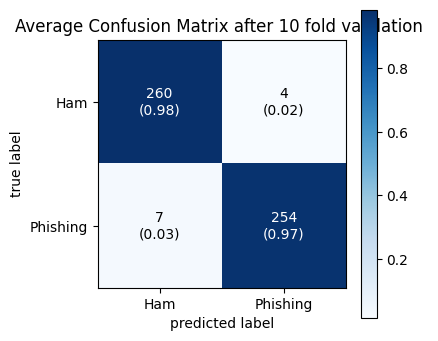

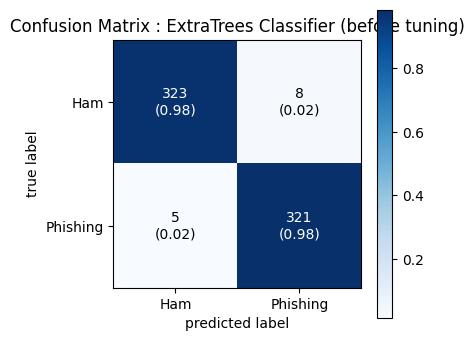

              precision    recall  f1-score   support

           0     0.9848    0.9758    0.9803       331
           1     0.9757    0.9847    0.9802       326

    accuracy                         0.9802       657
   macro avg     0.9802    0.9802    0.9802       657
weighted avg     0.9803    0.9802    0.9802       657

MCC:  0.96
Log Loss:  0.065
f1:  98.015
Balanced Accuracy:  98.025
Accuracy:  98.021
ROC_AUC :  98.025


In [ ]:
extc = ExtraTreesClassifier()
extc = training_and_cross_validation(extc)
MODEL.append('ExtraTrees Classifier (before tuning)')
show_performance_metrics(extc,MODEL[-1])

### Random Forest Classifier



Total Average Accuracy is  97.7524 %


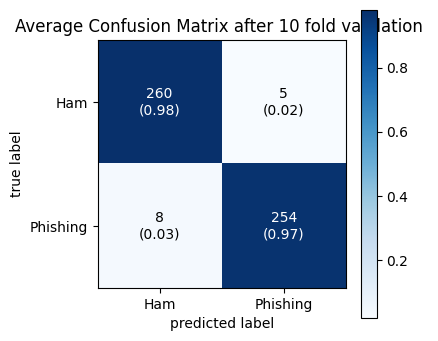

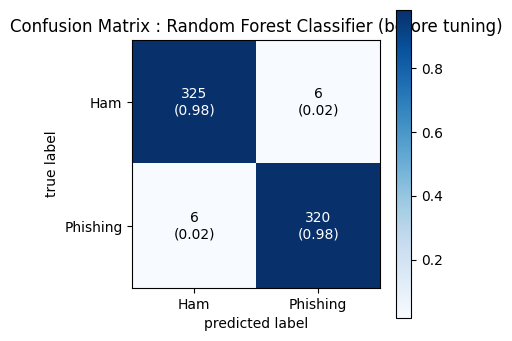

              precision    recall  f1-score   support

           0     0.9819    0.9819    0.9819       331
           1     0.9816    0.9816    0.9816       326

    accuracy                         0.9817       657
   macro avg     0.9817    0.9817    0.9817       657
weighted avg     0.9817    0.9817    0.9817       657

MCC:  0.963
Log Loss:  0.071
f1:  98.16
Balanced Accuracy:  98.173
Accuracy:  98.174
ROC_AUC :  98.173


In [ ]:
rf_c = RandomForestClassifier()
rf_c  = training_and_cross_validation(rf_c )
MODEL.append('Random Forest Classifier (before tuning)')
show_performance_metrics(rf_c,MODEL[-1])

In [ ]:
!pip install joblib


In [ ]:
import joblib

joblib.dump(lr, 'lr.pkl')
joblib.dump(svc, 'svc.pkl')
joblib.dump(gbc, 'gbc.pkl')
joblib.dump(extc, 'extc.pkl')
joblib.dump(rf_c, 'rf_c.pkl')
joblib.dump(mlpc, 'mlpc.pkl')


models = {
    'logistic regretion ': joblib.load('lr.pkl'),
    'support vector machine ': joblib.load('svc.pkl'),
    'gardient bosting ': joblib.load('gbc.pkl'),
    'extreme tree class': joblib.load('extc.pkl'),
    'randome forast clasffier': joblib.load('rf_c.pkl'),
    'mlpc forast clasffier': joblib.load('mlpc.pkl'),

}


## Fine tuning selected models

In [ ]:
kfold = 10

### ExtraTrees Classifier

In [ ]:
#ExtraTrees
ExtC = ExtraTreesClassifier()


## Search grid for optimal parameters
ex_param_grid = {"max_depth": [None],
              "max_features": [1, 3, 10],
              "min_samples_split": [2, 3, 10],
              "min_samples_leaf": [1, 3, 10],
              "bootstrap": [False],
              "n_estimators" :[100,300],
              "criterion": ["gini"]}


gsExtC = GridSearchCV(ExtC,param_grid = ex_param_grid, cv=kfold, scoring="balanced_accuracy", n_jobs= -1, verbose = 1)

gsExtC.fit(X_train,Y_train)

ExtC_best = gsExtC.best_estimator_

# Best score
gsExtC.best_score_


Fitting 10 folds for each of 54 candidates, totalling 540 fits


0.9797847826473781

ExtraTreesClassifier(max_features=10, min_samples_split=3)


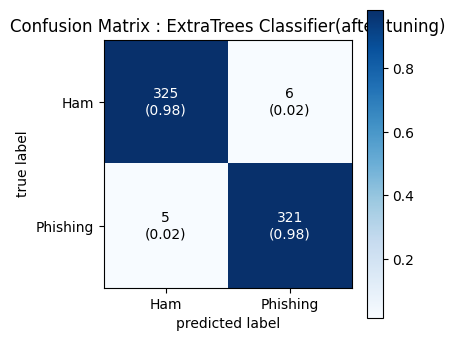

              precision    recall  f1-score   support

           0     0.9848    0.9819    0.9834       331
           1     0.9817    0.9847    0.9832       326

    accuracy                         0.9833       657
   macro avg     0.9832    0.9833    0.9833       657
weighted avg     0.9833    0.9833    0.9833       657

MCC:  0.967
Log Loss:  0.152
f1:  98.315
Balanced Accuracy:  98.327
Accuracy:  98.326
ROC_AUC :  98.327


In [ ]:
MODEL.append("ExtraTrees Classifier(after tuning)")
print(ExtC_best)
show_performance_metrics(ExtC_best,MODEL[-1],X_test)

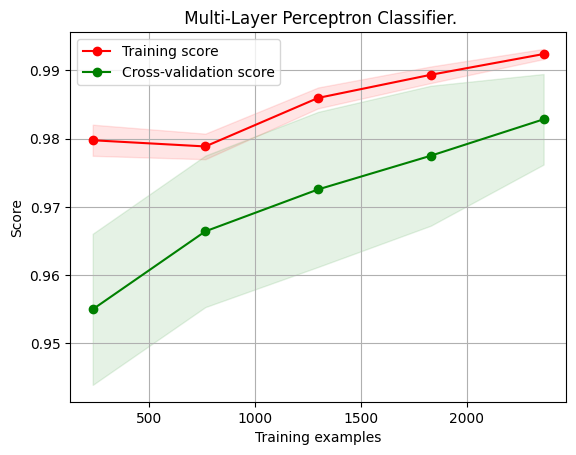

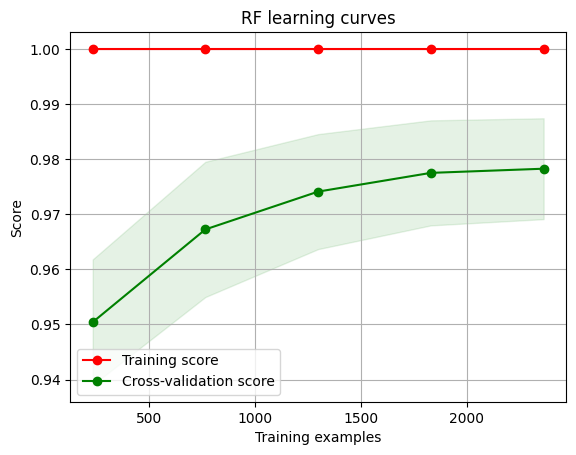

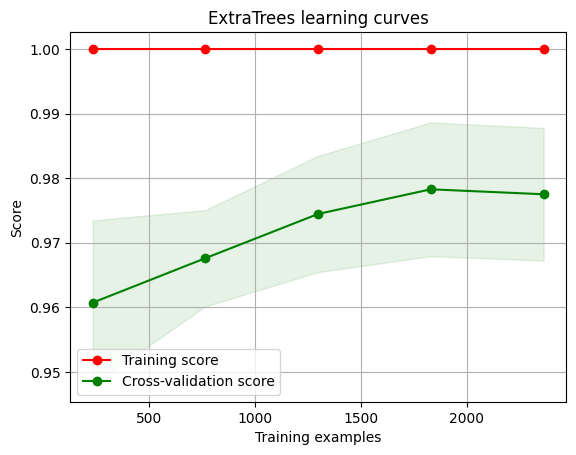

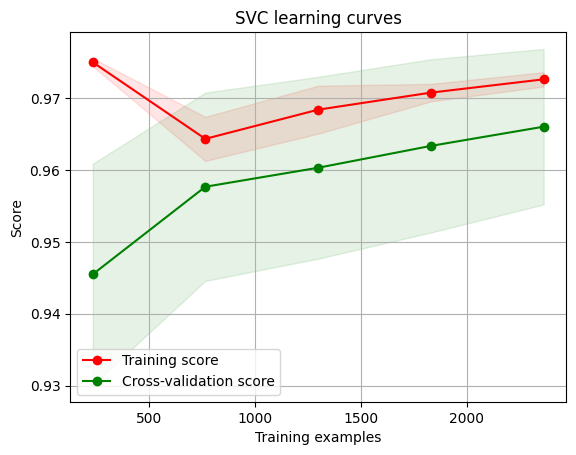

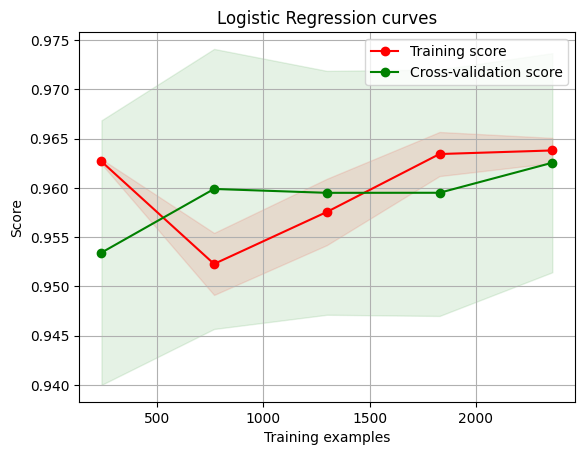

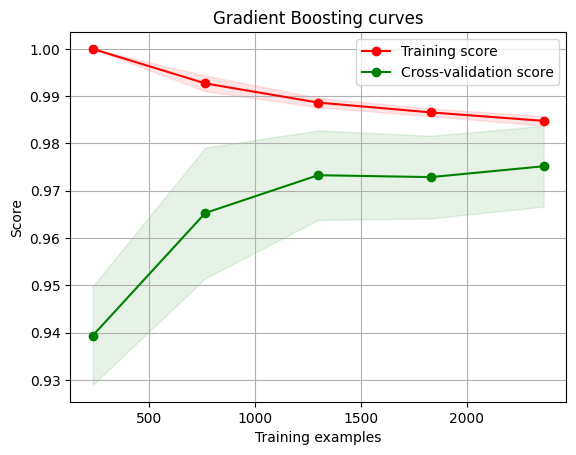

In [ ]:
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):
    """Generate a simple plot of the test and training learning curve"""
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs,scoring='balanced_accuracy', train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt
kfold = 10
g = plot_learning_curve(mlpc," Multi-Layer Perceptron Classifier.",X_train,Y_train,cv=kfold)
g = plot_learning_curve(rf_c,"RF learning curves",X_train,Y_train,cv=kfold)
g = plot_learning_curve(ExtC,"ExtraTrees learning curves",X_train,Y_train,cv=kfold)
g = plot_learning_curve(svc,"SVC learning curves",X_train,Y_train,cv=kfold)
g = plot_learning_curve(lr,"Logistic Regression curves",X_train,Y_train,cv=kfold)
g = plot_learning_curve(gbc,"Gradient Boosting curves",X_train,Y_train,cv=kfold)
# g = plot_learning_curve(soft_voting_model,"Voting Model learning curves",X_train,Y_train,cv=kfold)


Now, if we try to focus a bit on learning curve it reveals that:
- After a particular training size, SVC balances the bias and variance trade off and the curves are at almost same gap forward to the adequate training size.
- ExtraTrees also performed decent but after a point excess training leads to a slight increase in bias and then resulting underfitting.
- Random Forest also follows almost same trends as SVC, achieving decent balance between bias and variance.
- At last Logistic Regression and GradientBoosting are highly overfitting.<br><br>
So, for voting classifier we will go with three models:
- SVC (C=3, gamma=0.1, probability=True)
- ExtraTrees Classifier (max_features=1, min_samples_split=10, n_estimators=300)
- Random Forest Classifier (bootstrap=False, max_features=3, min_samples_leaf=3,min_samples_split=3)
<br>Above all three have good balanced accuracy and also do well on balancing the bias and variance trade off.


not sure at all

##  Ensemble Model (Voting Classifier)

Fitting 10 folds for each of 54 candidates, totalling 540 fits
Fitting 10 folds for each of 54 candidates, totalling 540 fits
Fitting 10 folds for each of 54 candidates, totalling 540 fits
Fitting 10 folds for each of 54 candidates, totalling 540 fits
Fitting 10 folds for each of 54 candidates, totalling 540 fits


Total Average Accuracy is  97.9048 %


VotingClassifier(estimators=[('Random Forest Model', RandomForestClassifier()),
                             ('ExtraTrees Classifier',
                              GridSearchCV(cv=10,
                                           estimator=ExtraTreesClassifier(),
                                           n_jobs=-1,
                                           param_grid={'bootstrap': [False],
                                                       'criterion': ['gini'],
                                                       'max_depth': [None],
                                                       'max_features': [1, 3,
                                                                        10],
                                                       'min_samples_leaf': [1,
                                                                            3,
                                                                            10],
                                                       'min_samples_split': [2,
                                                                             3,
                                                                             10],
                                                       'n_estimators': [100,
                                                                        300]},
                                           scoring='balanced_accuracy',
                                           verbose=1)),
                             ('SVC', SVC(probability=True)),
                             ('Multi-Layer Perceptron Classifier',
                              MLPClassifier())])

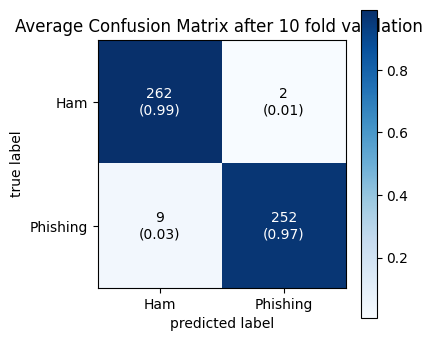

In [ ]:
voting_model = VotingClassifier(
    [
        ("Random Forest Model", rf_c),
        ("ExtraTrees Classifier",gsExtC),
        ("SVC",svc),
        ("Multi-Layer Perceptron Classifier",mlpc),


    ]
)


training_and_cross_validation(voting_model)



In [ ]:
import joblib

joblib.dump(voting_model, 'voting_model.pkl')
joblib.dump(ExtC_best, 'ExtC_best.pkl')


models = {
    'logistic regretion ': joblib.load('lr.pkl'),
    'support vector machine ': joblib.load('svc.pkl'),
    'gardient bosting ': joblib.load('gbc.pkl'),
    'extreme tree class': joblib.load('extc.pkl'),
    'randome forast clasffier': joblib.load('rf_c.pkl'),
    'ExtC_best': joblib.load('ExtC_best.pkl'),
    'mlpc forast clasffier': joblib.load('mlpc.pkl'),
    'voting_model': joblib.load('voting_model.pkl'),

}

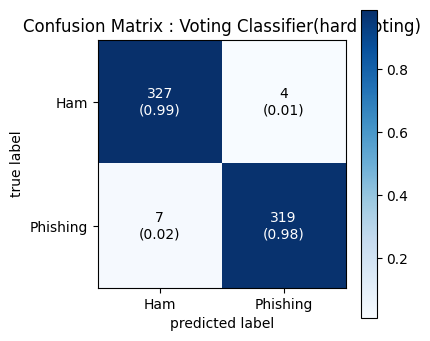

              precision    recall  f1-score   support

           0     0.9790    0.9879    0.9835       331
           1     0.9876    0.9785    0.9831       326

    accuracy                         0.9833       657
   macro avg     0.9833    0.9832    0.9833       657
weighted avg     0.9833    0.9833    0.9833       657

MCC:  0.967
Log Loss:  N/A
f1:  98.305
Balanced Accuracy:  98.322
Accuracy:  98.326
ROC_AUC :  98.322


In [ ]:
MODEL.append("Voting Classifier(hard voting)")
show_performance_metrics(voting_model,"Voting Classifier(hard voting)")

KeyboardInterrupt: ignored

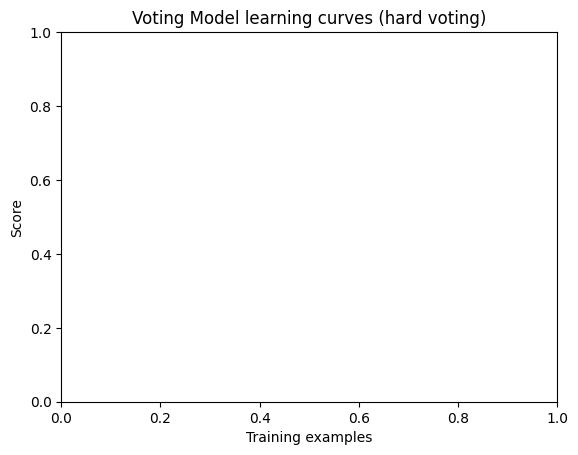

In [ ]:
g = plot_learning_curve(voting_model,"Voting Model learning curves (hard voting)",X_train,Y_train,cv=3)

 yet they have very good balance in bias and variance trade off. They can be very useful in real world application as they tend not to overfit the training data while minimizing the gap between training and cross validation error. Thus, it could be inferred that they will perform better in real world application.

## Performance Comparisons

In [ ]:
performance_comp = []
performance_comp.append(["Model","Accuracy","Balanced Accuracy","Log loss","F1 Score","MCC","ROC_AUC","Report"])
for model in MODEL:
    row = []
    row.append(model)
    row.append(ACCURACY[model])
    row.append(BALANCED_ACCURACY[model])
    row.append(LOG_LOSS[model])
    row.append(F1[model])
    row.append(MCC[model])
    row.append(ROC_AUC[model])
    row.append(REPORT[model])
    performance_comp.append(row)
performance_comp = pd.DataFrame(performance_comp[1:],columns=performance_comp[0])
performance_comp
# performance_comp.to_csv('performance comparision.csv')

,Model,Accuracy,Balanced Accuracy,Log loss,F1 Score,MCC,ROC_AUC,Report
0,Logistic Regression(before tuning),96.347,96.338,0.111,96.273,0.927,96.338,precision recall f1-score ...
1,mlpc MultipleLayerPerceptron,98.326,98.318,0.055,98.295,0.967,98.318,precision recall f1-score ...
2,SVC (before tuning),96.347,96.335,0.129,96.262,0.927,96.335,precision recall f1-score ...
3,Gradient Boosting Classifier (before tuning),96.195,96.186,0.095,96.124,0.924,96.186,precision recall f1-score ...
4,ExtraTrees Classifier (before tuning),97.412,97.413,0.075,97.397,0.948,97.413,precision recall f1-score ...
5,Random Forest Classifier (before tuning),96.804,96.805,0.128,96.784,0.936,96.805,precision recall f1-score ...
6,ExtraTrees Classifier(after tuning),97.260,97.260,0.066,97.239,0.945,97.260,precision recall f1-score ...


testing the model from an input user

In [ ]:
from email import message_from_string

# Function to extract features from user input
def extract_features(email):
    # Note: Replace the below function calls with actual feature extraction steps you used
    # Extract parts of the email
    email_body = get_email_body(email)
    urls = getURLs(email_body)
    subject = email["Subject"]
    headers = dict(email.items())


    feature_data = {
        'number_of_dots': number_of_dots(headers),
        'number_of_dash': number_of_dash(headers),
        'subject_richness': subject_richness(subject),
        'contains_verify': contains_verify(subject),
        'contains_update': contains_update(subject),
        'contains_access': contains_access(subject),
        'contains_prime_targets': contains_prime_targets(subject),
        'contains_account': contains_account(subject),
        'contains_suspended': contains_suspended(subject),
        'contains_password': contains_password(subject),
        'contains_urgent': contains_urgent(subject),
        'IPasURL': IPasURL(urls),
        'textLinkDisparity': textLinkDisparity(email_body),
        'maliciousURL': maliciousURL(urls),
        'hexadecimalURL': hexadecimalURL(urls),
        'maxDomainsCounts': maxDomainsCounts(urls),
        'at_in_url': at_in_url(urls),
        'presenceHTML': presenceHTML(email_body),
        'presenceHTMLFORM': presenceHTMLFORM(email_body),
        'presenceHTMLIFRAME': presenceHTMLIFRAME(email_body),
        'presenceJavaScript': presenceJavaScript(email_body),
        'presenceFlashContent': presenceFlashContent(email_body),
        'presenceGeneralSalutation': presenceGeneralSalutation(email_body),
        'numberOfAttachments': numberOfAttachments(email_body),
        'mail_to': mail_to(email_body),
        'popups': popups(email_body),
        'body_richness': body_richness(email_body)
    }

    # Convert the dictionary into a DataFrame
    df = pd.DataFrame([feature_data])
    df['sum'] = df.sum(axis=1)
    # Your selected features set
    Selected_features = {
    'IPasURL',
    'body_richness',
    'contains_access',
    'contains_account',
    'contains_prime_targets',
    'hexadecimalURL',
    'mail_to',
    'maliciousURL',
    'maxDomainsCounts',
    'number_of_dash',
    'number_of_dots',
    'popups',
    'presenceGeneralSalutation',
    'subject_richness',
    'sum',
    'textLinkDisparity'}

    # Convert set to list
    Selected_features_list = list(Selected_features)
    # Select columns
    df_selected = df[Selected_features_list]
    print(df_selected)

    # Calculate the sum feature
    return df_selected

def parse_email(email_str):
    # Parses a string into an email object
    return message_from_string(email_str)

# User interaction
def predict_spam_or_ham(models):
    # Ask the user for the email text
    email = input("Please enter the email text:\n")
    email = parse_email(email)


    # Extract features from the user input
    features = extract_features(email)
    print(features)

    # List out models for user to choose
    for i, model_name in enumerate(models.keys()):
        print(f"{i+1}. {model_name}")

    # Choose a model by number
    model_number = int(input("Please enter the number of the model to use:\n"))
    model_name = list(models.keys())[model_number-1]
    model = models[model_name]

    # Make a prediction
    prediction = model.predict(features)


    # Interpret the prediction
    if prediction[0] == 1:
        print("The email is predicted to be spam.")
    else:
        print("The email is predicted to be ham.")

    return email



# Load your models

# Run the user interaction function
predict_spam_or_ham(models)

body = get_email_body(email)
print(body)
urls = getURLs(body)
print(urls)
ip_count = IPasURL(urls)
print(ip_count)


Please enter the email text:
From social-admin@linux.ie  Mon Jul 22 19:23:00 2002 Return-Path: <social-admin@linux.ie> Delivered-To: yyyy@localhost.netnoteinc.com Received: from localhost (localhost [127.0.0.1]) 	by phobos.labs.netnoteinc.com (Postfix) with ESMTP id 734A8440C8 	for <jm@localhost>; Mon, 22 Jul 2002 14:22:58 -0400 (EDT) Received: from dogma.slashnull.org [212.17.35.15] 	by localhost with IMAP (fetchmail-5.9.0) 	for jm@localhost (single-drop); Mon, 22 Jul 2002 19:22:58 +0100 (IST) Received: from webnote.net (mail.webnote.net [193.120.211.219]) by     dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g6MG3UY17510 for     <jm+ilug-social@jmason.org>; Mon, 22 Jul 2002 17:03:32 +0100 Received: from lugh.tuatha.org (root@lugh.tuatha.org [194.125.145.45]) by     webnote.net (8.9.3/8.9.3) with ESMTP id SAA24559 for     <jm+ilug-social@jmason.org>; Sat, 20 Jul 2002 18:51:31 +0100 Received: from lugh (root@localhost [127.0.0.1]) by lugh.tuatha.org     (8.9.3/8.9.3) with ESMTP id S

If your model is always predicting emails as spam, it could be due to a variety of issues. Here are a few steps you could take to improve your model:

1. **Check your data**: Look at the distribution of your training data. If there's a large imbalance between the spam and ham emails, your model may be biased towards predicting the majority class. You might need to balance your classes through techniques like oversampling the minority class or undersampling the majority class.

2. **Feature Engineering**: Look at the features you're using to train your model. Are they truly indicative of whether an email is spam or not? If not, you might need to engineer new features that better capture the characteristics of spam and ham emails.

3. **Model Selection**: If you're not getting good results with your current model, you might want to consider trying different algorithms. Different models have different strengths and weaknesses, and it might be that another model is better suited to your particular problem.

4. **Model Tuning**: If you're using a model with hyperparameters, you can try tuning them to see if that improves your model's performance. Be careful not to overfit your model to the training data, though.

5. **Ensemble Methods**: Sometimes, combining the predictions of several models can lead to better results than any single model. This is the idea behind ensemble methods like Random Forests and Gradient Boosting.

6. **Evaluation Metrics**: Accuracy isn't always the best metric, especially for imbalanced datasets. You might want to look at other metrics like precision, recall, F1 score, and the area under the ROC curve (AUC-ROC).

Lastly, machine learning models often require many iterations and a lot of fine-tuning to perform well, so don't be discouraged if your initial results aren't as good as you'd hoped. It's all part of the process!

## Conclusions

During the research both ExtraTrees Classifier and Random Forest were really close to each other performance wise. Although balanced accuracy of both the ExtraTrees Classifier and Random Forest are same yet Random Forest has good log loss score in comparison to ExtraTrees.<br><br>
Random Forest came out as the better model to identify the phishing mail considering the selected features than ExtraTrees as it has decent balance of bias and variance. SVC would also be a really good choice in real world as shown in research it smoothly balances the bias and variance tradeoff thus it learns while training still it doesn’t overfit and can perform really good in new data.<br><br>
The bar plot above shows how the models performed in terms of balanced accuracy score. We can see every model has improved the performance after tuning up.

Following inferences are made from the research :
1. Best performing model is hyperparameter tuned Random Forest Classifier with accuracy of 98.469% and log loss of 0.066.and parameters are (bootstrap=False,max_features=3,min_leaf_sample=3,min_sample_split=3)
2. Although Random Forest performed best in our research experiment, SVM and Voting Classifier turns out to be better in balancing bias and variance tradeoff.
3. Logistic Regression and Gradient Boosting tend to overfit so better to avoid or use in a way that can counter the overfitting. For example, we can include them in model stacking or voting classifier and counter the overfit by adjusting the weights.
4. Lastly, it is evident that to have better real world performing model we can go for Voting Classifier. We can have better performance to new test data while sacrificing minimal accuracy.